In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
dfWine = pd.read_csv(r'C:\Users\Tat\Desktop\Data Trained\wineQuality.csv')

In [3]:
dfWine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
dfWine.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


In [5]:
dfWine.shape

(1599, 12)

In [6]:
dfWine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [7]:
dfWine.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [8]:
dfWine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


We have float type values in all independent variables and int type values in target variable.

In [9]:
dfWine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In this dataset, we have no null values.

<AxesSubplot:>

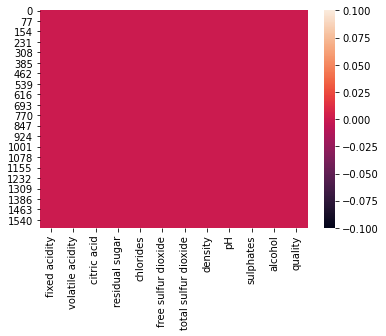

In [10]:
# Checking missing values using heatmap()
sns.heatmap(dfWine.isnull())

According to the problem statement, we need to set an arbitrary cutoff for our dependent variable (wine quality) at e.g. 7 or higher getting classified as 'good/1' and the remainder as 'not good/0'.

In [11]:
# checking out what are the different-different values under quality variable..
dfWine.quality.unique() 

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [12]:
bins = (2, 6.5, 8) #  here, we are saying label the values which come in the interval 2 to 6.5 as bad and 6.5 to 8 as good
group_names = ['bad', 'good']
dfWine['quality'] = pd.cut(dfWine['quality'], bins = bins, labels = group_names)
# Pandas cut() function is used to separate the array elements into different bins...

In [13]:
dfWine['quality']

0       bad
1       bad
2       bad
3       bad
4       bad
       ... 
1594    bad
1595    bad
1596    bad
1597    bad
1598    bad
Name: quality, Length: 1599, dtype: category
Categories (2, object): ['bad' < 'good']

In [14]:
dfWine.quality.value_counts()

bad     1382
good     217
Name: quality, dtype: int64

In [15]:
dfWine.dtypes

fixed acidity            float64
volatile acidity         float64
citric acid              float64
residual sugar           float64
chlorides                float64
free sulfur dioxide      float64
total sulfur dioxide     float64
density                  float64
pH                       float64
sulphates                float64
alcohol                  float64
quality                 category
dtype: object

Here, we have a classification problem as we have classes/category in our target variable.

Here, we have float type values in all independent variables and category type in target variable. So, we need to apply encoding for our target variable. We will change it into 0 and 1 format using LabelEncoder.

In [16]:
from sklearn.preprocessing import LabelEncoder

In [17]:
le = LabelEncoder()

In [18]:
dfWine['quality'] = le.fit_transform(dfWine['quality'])

In [19]:
dfWine['quality']

0       0
1       0
2       0
3       0
4       0
       ..
1594    0
1595    0
1596    0
1597    0
1598    0
Name: quality, Length: 1599, dtype: int32

In [20]:
dfWine.quality.unique()

array([0, 1])

In [21]:
dfWine.quality.value_counts()

0    1382
1     217
Name: quality, dtype: int64

In [22]:
x = dfWine.iloc[:,0:-1]
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [23]:
y = dfWine.iloc[:,-1]
y

0       0
1       0
2       0
3       0
4       0
       ..
1594    0
1595    0
1596    0
1597    0
1598    0
Name: quality, Length: 1599, dtype: int32

In [24]:
y.value_counts()

0    1382
1     217
Name: quality, dtype: int64

### EDA

#### Univariate Analysis

<AxesSubplot:xlabel='quality', ylabel='count'>

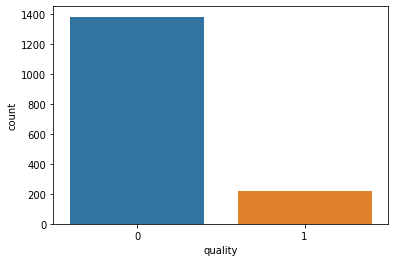

In [25]:
sns.countplot(y)

Here, we have class imbalance issue as 0 and 1 values are not equally distributed. So, here we use SMOTE to balance the classes. Hence, we will make the minority class equal to majority class. 

### Applying SMOTE

In [26]:
import sklearn
sklearn.__version__

'0.24.2'

In [27]:
import numpy
numpy.__version__

'1.21.0'

In [28]:
!pip install scikit-learn

In [29]:
!pip install imblearn

In [30]:
!pip install -U imbalanced-learn

In [31]:
from imblearn.over_sampling import SMOTE

In [32]:
smt = SMOTE()

In [33]:
# .fit_resample() method is used to balance the dataset
x_train,y_train = smt.fit_resample(x,y)

In [34]:
y.value_counts()

0    1382
1     217
Name: quality, dtype: int64

In [35]:
y_train.value_counts()

0    1382
1    1382
Name: quality, dtype: int64

<AxesSubplot:xlabel='quality', ylabel='count'>

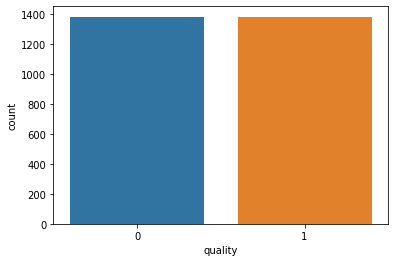

In [36]:
sns.countplot(y_train)

<AxesSubplot:xlabel='fixed acidity', ylabel='Density'>

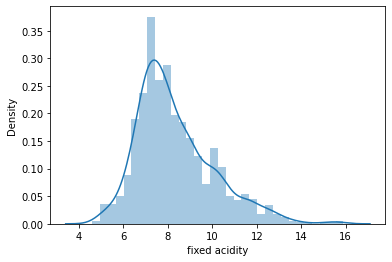

In [37]:
sns.distplot(dfWine['fixed acidity'])
# here, the data is not normally distributed, so outliers/skewness is present..

<AxesSubplot:xlabel='fixed acidity'>

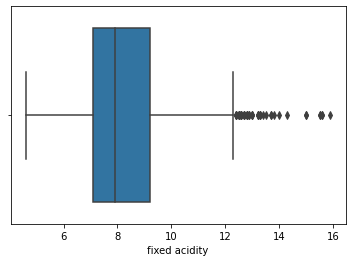

In [38]:
# detecting outliers using boxplot..here, we can see the outliers are present..
sns.boxplot(dfWine['fixed acidity'])

<AxesSubplot:xlabel='volatile acidity', ylabel='Density'>

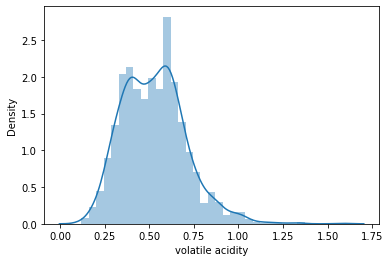

In [39]:
sns.distplot(dfWine['volatile acidity'])

<AxesSubplot:xlabel='volatile acidity'>

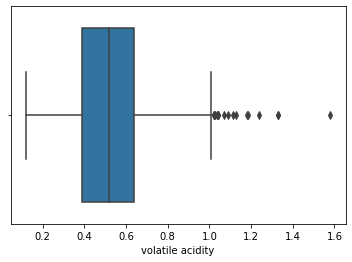

In [40]:
sns.boxplot(dfWine['volatile acidity'])
# here, also outliers are present...

<AxesSubplot:xlabel='citric acid', ylabel='Density'>

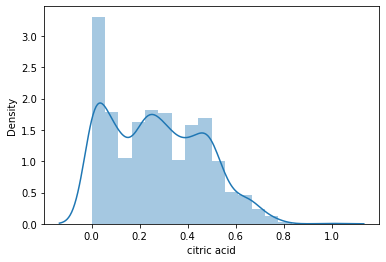

In [41]:
sns.distplot(dfWine['citric acid'])
# here the data is not normally distributed, so outliers and skewness is present..

<AxesSubplot:xlabel='citric acid'>

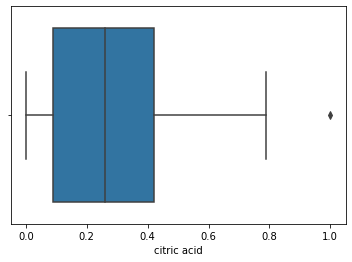

In [42]:
sns.boxplot(dfWine['citric acid'])
# here very few outlier can be seen...

<AxesSubplot:xlabel='residual sugar', ylabel='Density'>

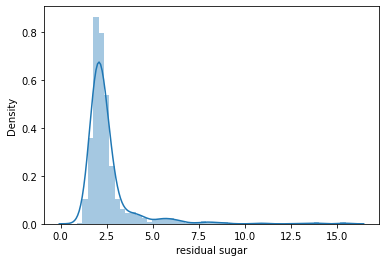

In [43]:
sns.distplot(dfWine['residual sugar'])

<AxesSubplot:xlabel='residual sugar'>

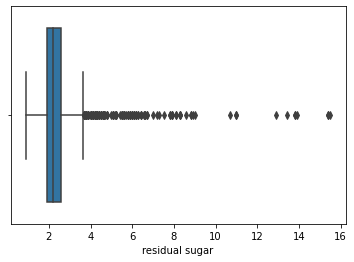

In [44]:
sns.boxplot(dfWine['residual sugar'])
# outliers are present in large amount..

<AxesSubplot:xlabel='chlorides', ylabel='Density'>

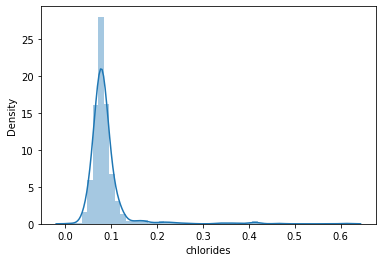

In [45]:
sns.distplot(dfWine['chlorides'])

<AxesSubplot:xlabel='chlorides'>

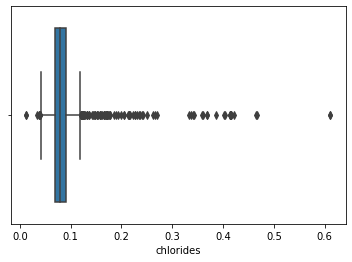

In [46]:
sns.boxplot(dfWine['chlorides'])
# outliers are present in large amount..

<AxesSubplot:xlabel='free sulfur dioxide', ylabel='Density'>

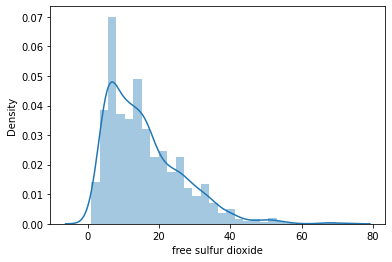

In [47]:
sns.distplot(dfWine['free sulfur dioxide'])

<AxesSubplot:xlabel='free sulfur dioxide'>

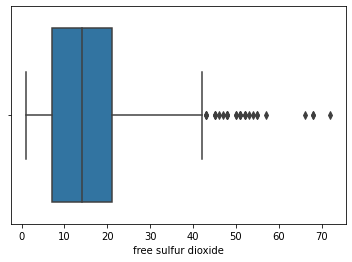

In [48]:
sns.boxplot(dfWine['free sulfur dioxide'])
# outliers are present...

<AxesSubplot:xlabel='total sulfur dioxide', ylabel='Density'>

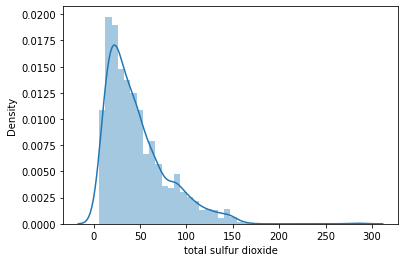

In [49]:
sns.distplot(dfWine['total sulfur dioxide'])

<AxesSubplot:xlabel='total sulfur dioxide'>

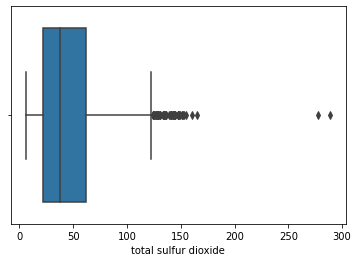

In [50]:
sns.boxplot(dfWine['total sulfur dioxide'])
# outliers are present

<AxesSubplot:xlabel='density', ylabel='Density'>

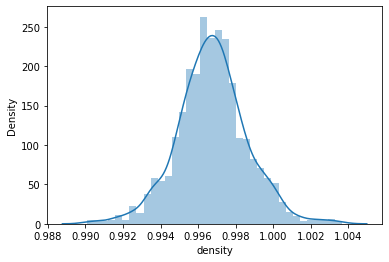

In [51]:
sns.distplot(dfWine['density'])

<AxesSubplot:xlabel='density'>

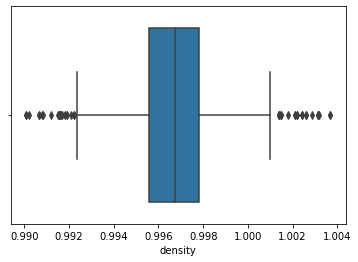

In [52]:
sns.boxplot(dfWine['density'])
# outliers are present...

<AxesSubplot:xlabel='pH', ylabel='Density'>

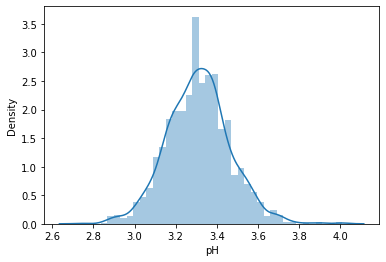

In [53]:
sns.distplot(dfWine['pH'])

<AxesSubplot:xlabel='pH'>

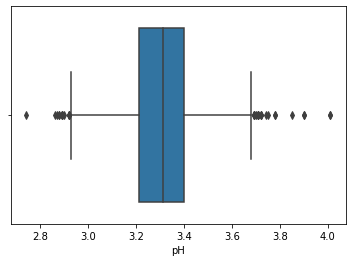

In [54]:
sns.boxplot(dfWine['pH'])
# outliers are present

<AxesSubplot:xlabel='sulphates', ylabel='Density'>

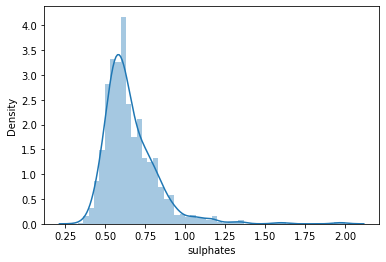

In [55]:
sns.distplot(dfWine['sulphates'])

<AxesSubplot:xlabel='sulphates'>

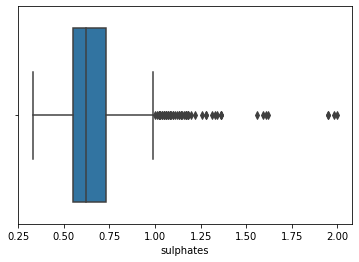

In [56]:
sns.boxplot(dfWine['sulphates'])
# outliers are present

<AxesSubplot:xlabel='alcohol', ylabel='Density'>

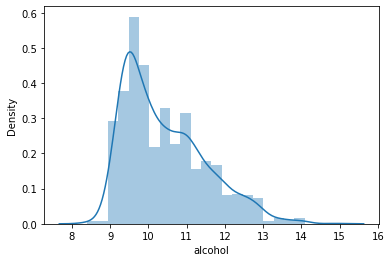

In [57]:
sns.distplot(dfWine['alcohol'])

<AxesSubplot:xlabel='alcohol'>

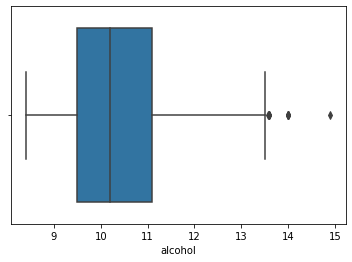

In [58]:
sns.boxplot(dfWine['alcohol'])
# few outliers are present

#### Bi variate Analysis

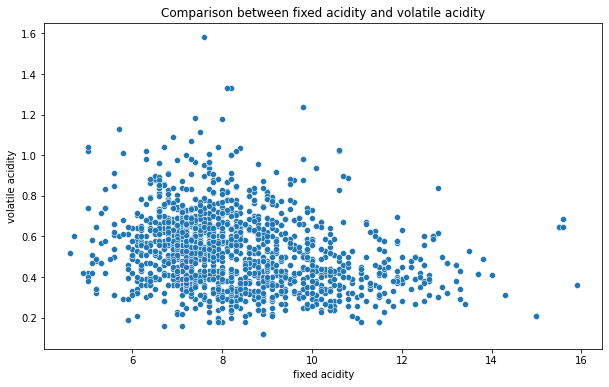

In [59]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and volatile acidity')
sns.scatterplot(dfWine['fixed acidity'], dfWine['volatile acidity']);

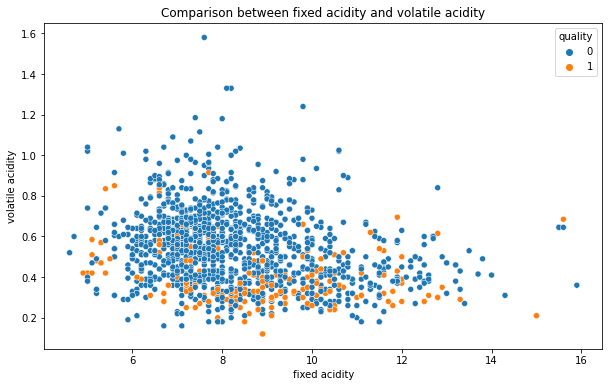

In [60]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and volatile acidity')
sns.scatterplot(dfWine['fixed acidity'], dfWine['volatile acidity'],hue = dfWine['quality']);

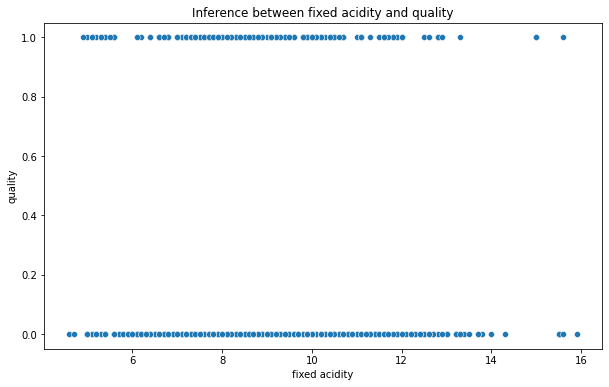

In [61]:
plt.figure(figsize=[10,6])
plt.title('Inference between fixed acidity and quality')
sns.scatterplot(dfWine['fixed acidity'], dfWine['quality']);

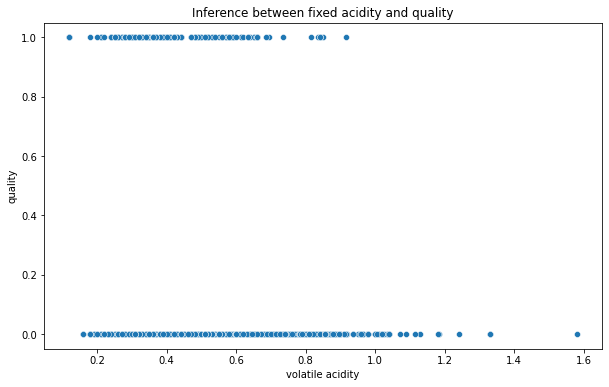

In [62]:
plt.figure(figsize=[10,6])
plt.title('Inference between fixed acidity and quality')
sns.scatterplot(dfWine['volatile acidity'], dfWine['quality']);

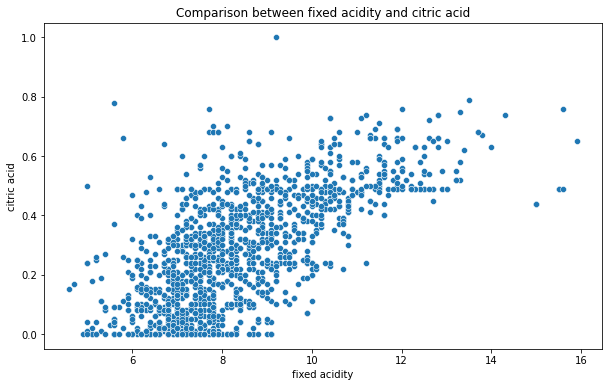

In [63]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and citric acid')
sns.scatterplot(dfWine['fixed acidity'], dfWine['citric acid']);

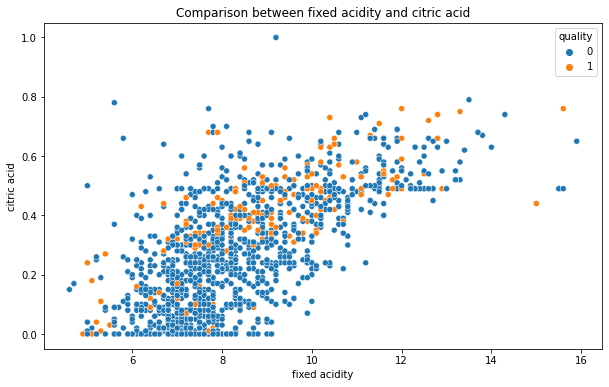

In [64]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and citric acid')
sns.scatterplot(dfWine['fixed acidity'], dfWine['citric acid'],hue = dfWine['quality']);

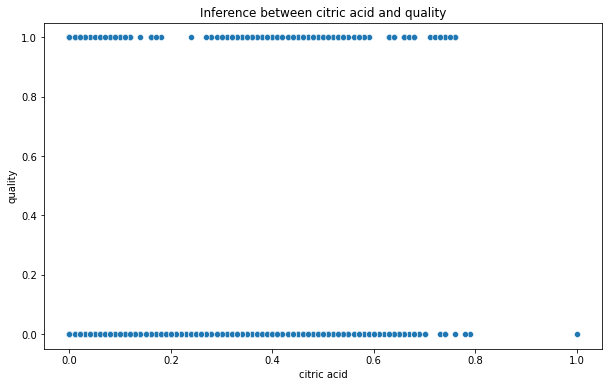

In [65]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between citric acid and quality')
sns.scatterplot(dfWine['citric acid'], dfWine['quality']);

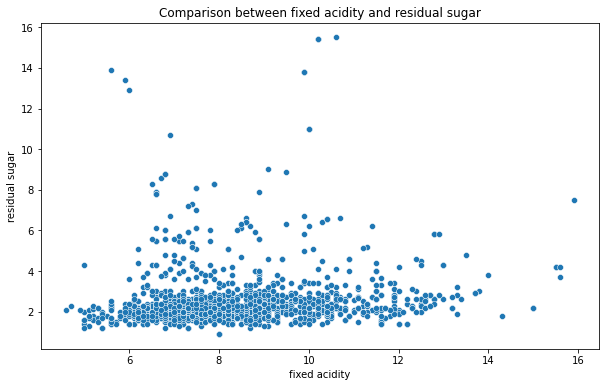

In [66]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and residual sugar')
sns.scatterplot(dfWine['fixed acidity'], dfWine['residual sugar']);

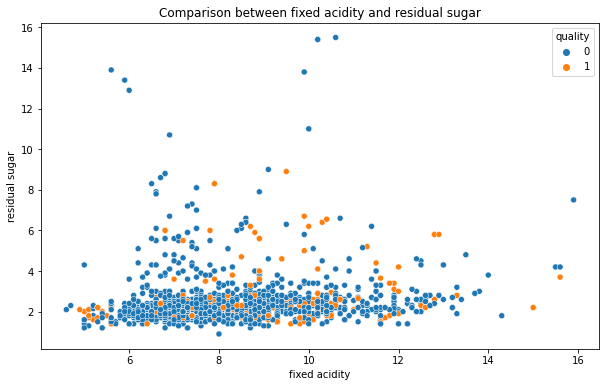

In [67]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and residual sugar')
sns.scatterplot(dfWine['fixed acidity'], dfWine['residual sugar'],hue = dfWine['quality']);

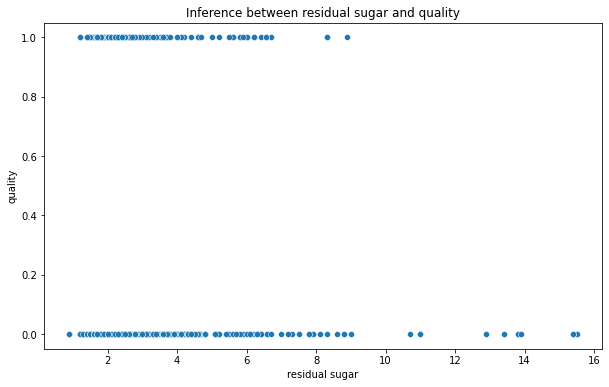

In [68]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between residual sugar and quality')
sns.scatterplot(dfWine['residual sugar'], dfWine['quality']);

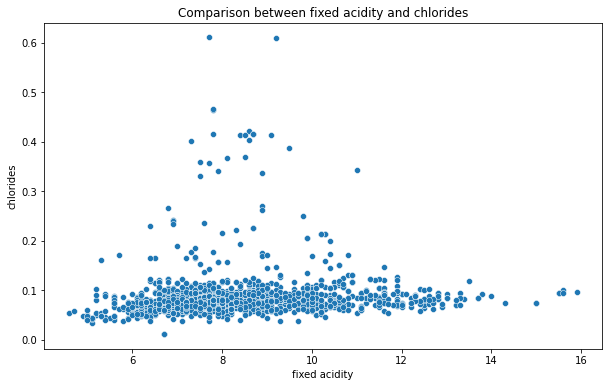

In [69]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and chlorides')
sns.scatterplot(dfWine['fixed acidity'], dfWine['chlorides']);

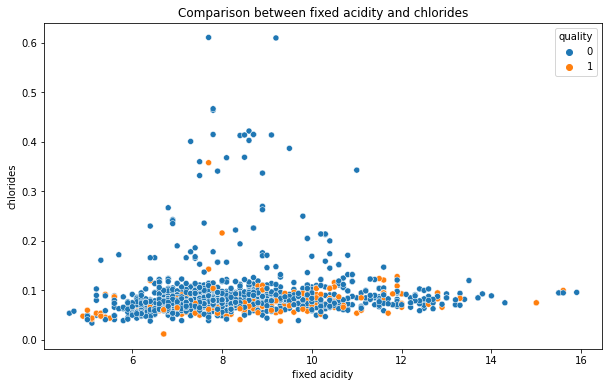

In [70]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and chlorides')
sns.scatterplot(dfWine['fixed acidity'], dfWine['chlorides'], hue = dfWine['quality']);

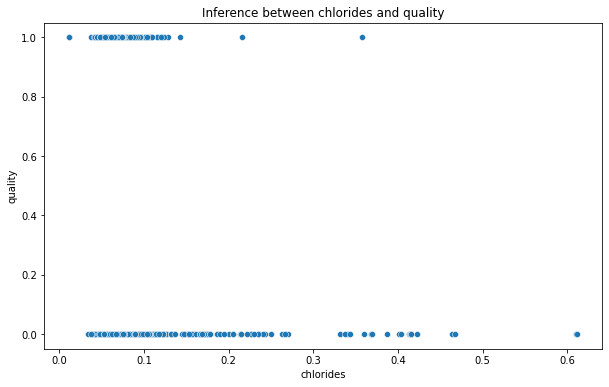

In [71]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between chlorides and quality')
sns.scatterplot(dfWine['chlorides'], dfWine['quality']);

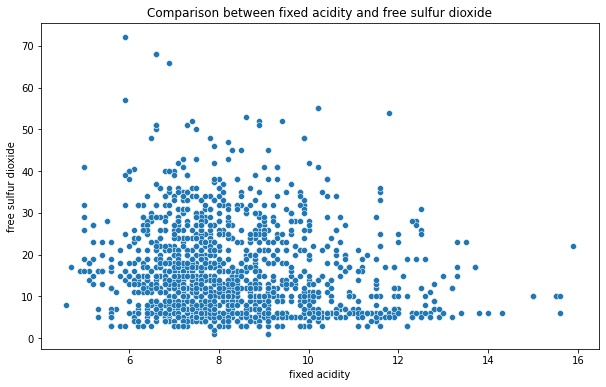

In [72]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and free sulfur dioxide')
sns.scatterplot(dfWine['fixed acidity'], dfWine['free sulfur dioxide']);

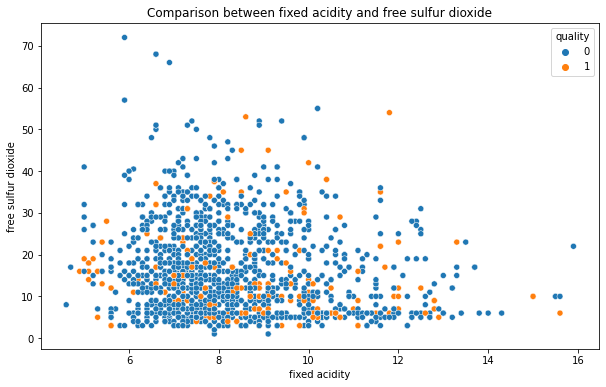

In [73]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and free sulfur dioxide')
sns.scatterplot(dfWine['fixed acidity'], dfWine['free sulfur dioxide'], hue = dfWine['quality']);

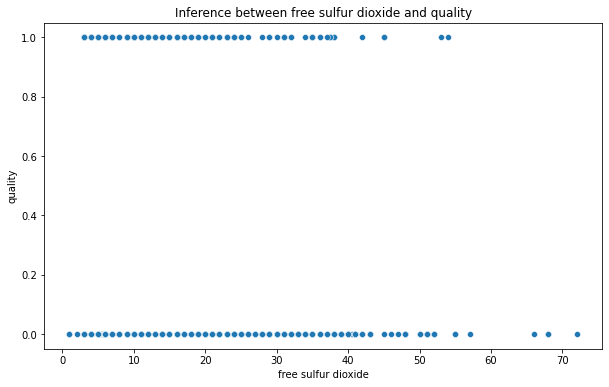

In [74]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between free sulfur dioxide and quality')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['quality']);

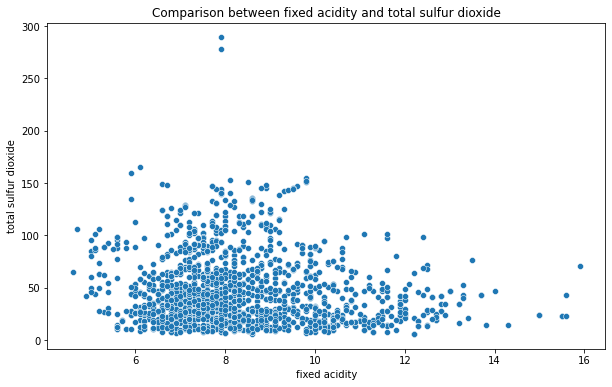

In [75]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and total sulfur dioxide')
sns.scatterplot(dfWine['fixed acidity'], dfWine['total sulfur dioxide']);

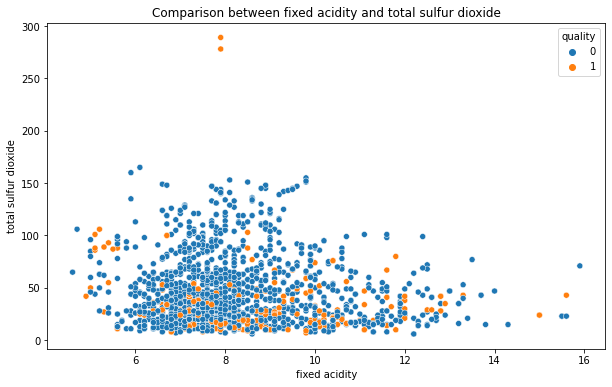

In [76]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and total sulfur dioxide')
sns.scatterplot(dfWine['fixed acidity'], dfWine['total sulfur dioxide'], hue = dfWine['quality']);

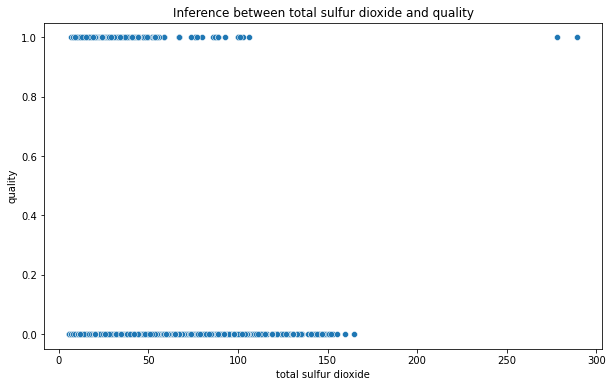

In [77]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between total sulfur dioxide and quality')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['quality']);

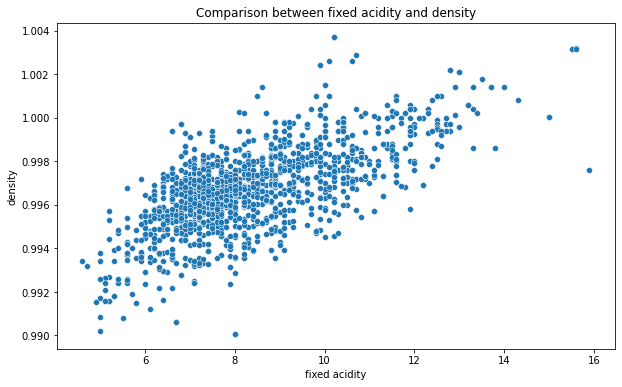

In [78]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and density')
sns.scatterplot(dfWine['fixed acidity'], dfWine['density']);

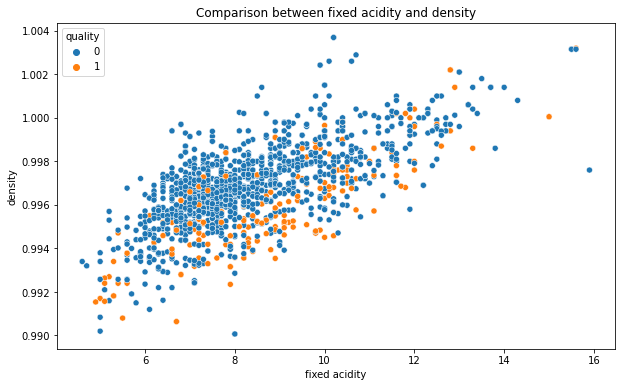

In [79]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and density')
sns.scatterplot(dfWine['fixed acidity'], dfWine['density'], hue = dfWine['quality']);

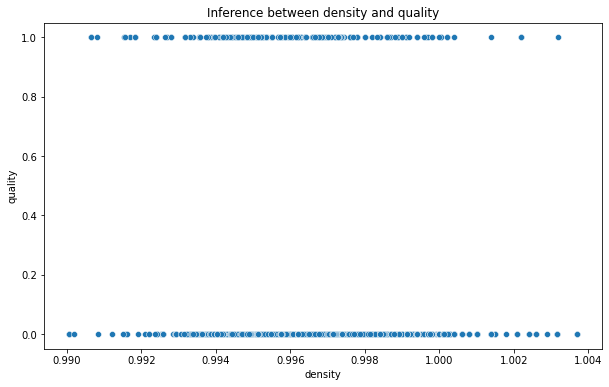

In [80]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between density and quality')
sns.scatterplot(dfWine['density'], dfWine['quality']);

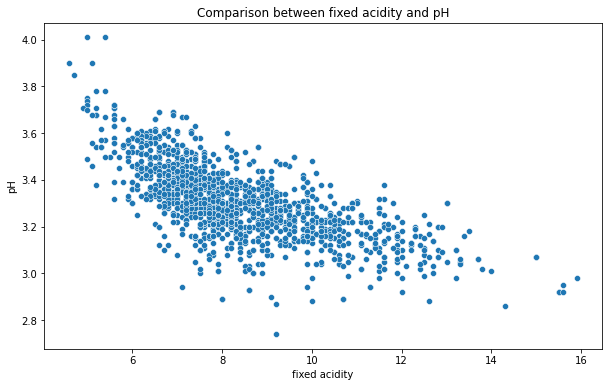

In [81]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and pH')
sns.scatterplot(dfWine['fixed acidity'], dfWine['pH']);

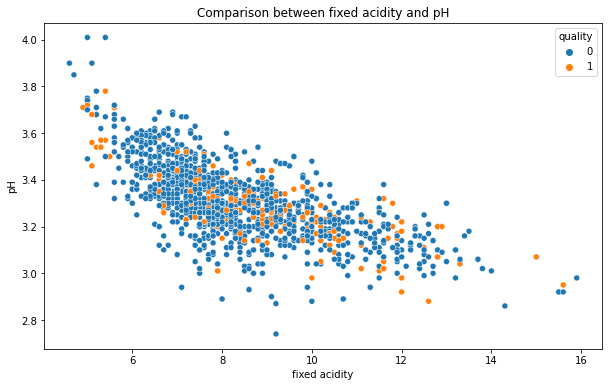

In [82]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and pH')
sns.scatterplot(dfWine['fixed acidity'], dfWine['pH'], hue = dfWine['quality']);

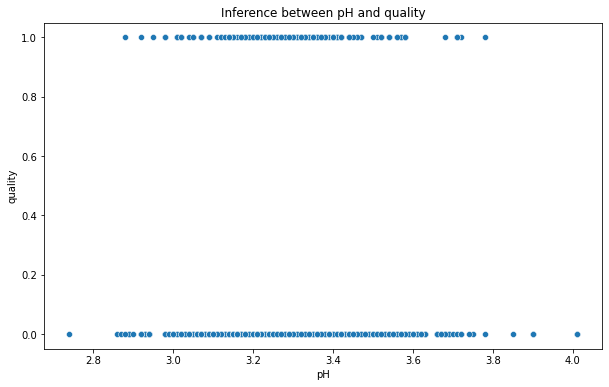

In [83]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between pH and quality')
sns.scatterplot(dfWine['pH'], dfWine['quality']);

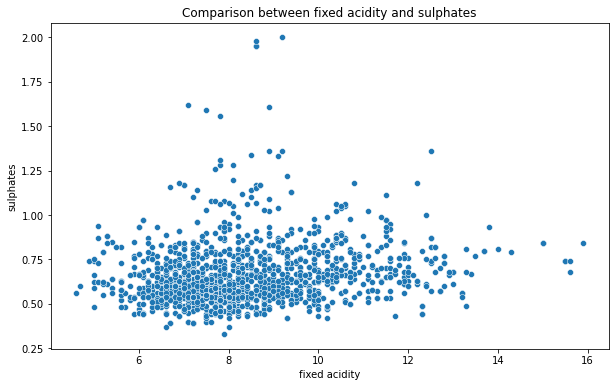

In [84]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and sulphates')
sns.scatterplot(dfWine['fixed acidity'], dfWine['sulphates']);

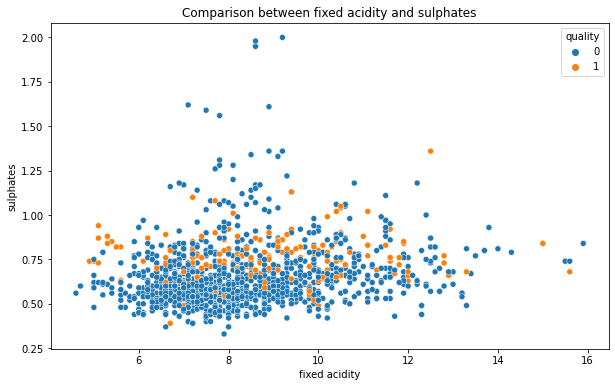

In [85]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and sulphates')
sns.scatterplot(dfWine['fixed acidity'], dfWine['sulphates'], hue = dfWine['quality']);

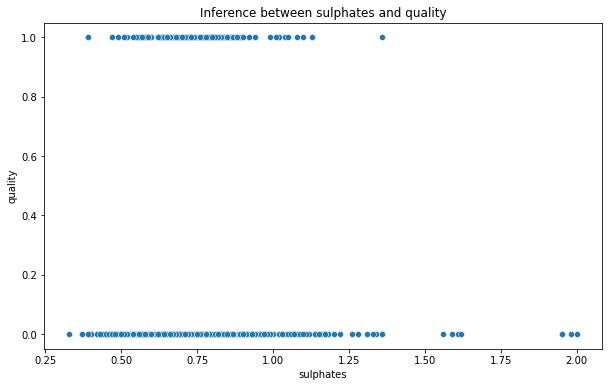

In [86]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between sulphates and quality')
sns.scatterplot(dfWine['sulphates'], dfWine['quality']);

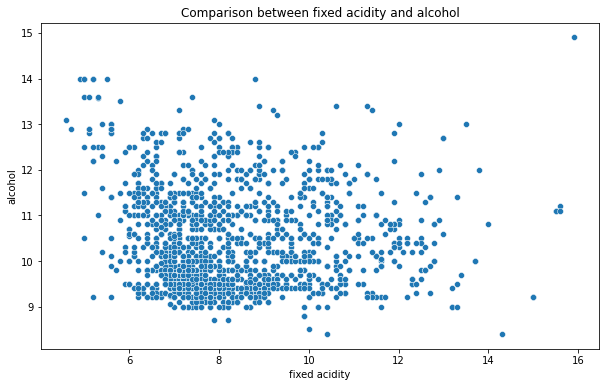

In [87]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and alcohol')
sns.scatterplot(dfWine['fixed acidity'], dfWine['alcohol']);

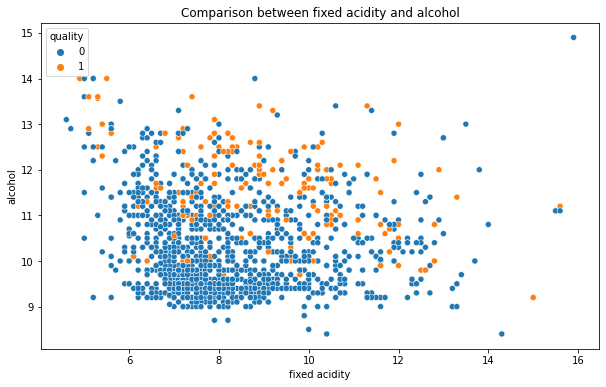

In [88]:
plt.figure(figsize=[10,6])
plt.title('Comparison between fixed acidity and alcohol')
sns.scatterplot(dfWine['fixed acidity'], dfWine['alcohol'], hue = dfWine['quality']);

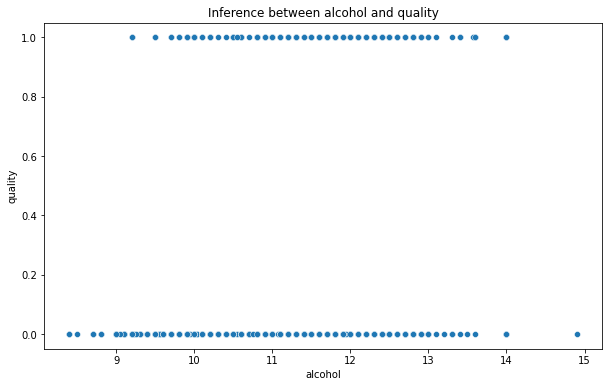

In [89]:
# Bi variate analysis with target variable
plt.figure(figsize=[10,6])
plt.title('Inference between alcohol and quality')
sns.scatterplot(dfWine['alcohol'], dfWine['quality']);

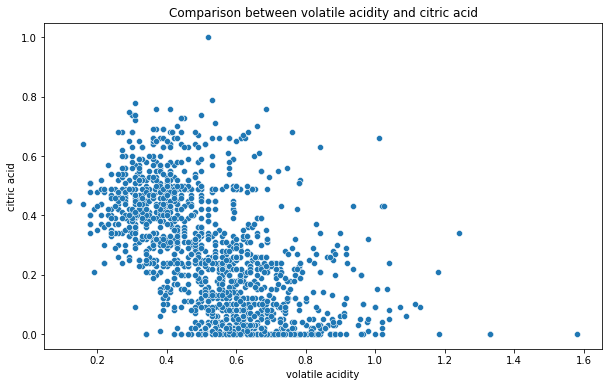

In [90]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and citric acid')
sns.scatterplot(dfWine['volatile acidity'], dfWine['citric acid']);

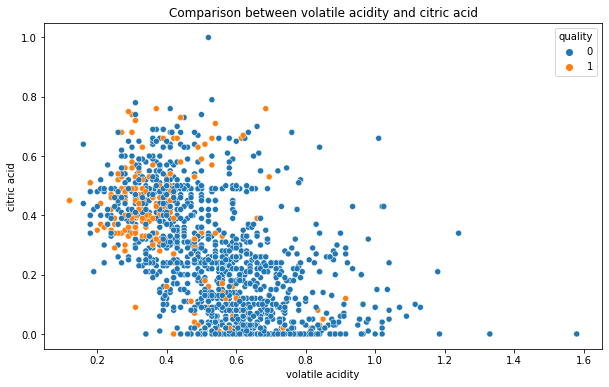

In [91]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and citric acid')
sns.scatterplot(dfWine['volatile acidity'], dfWine['citric acid'],hue = dfWine['quality']);

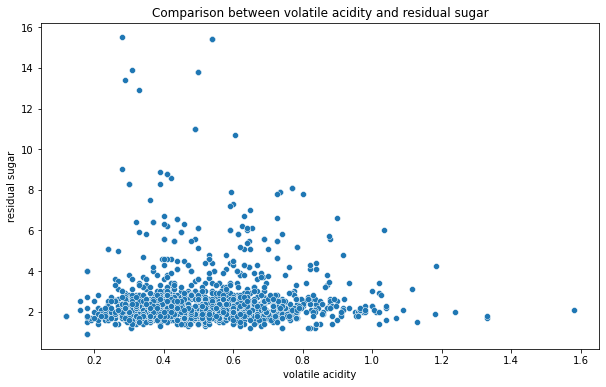

In [92]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and residual sugar')
sns.scatterplot(dfWine['volatile acidity'], dfWine['residual sugar']);

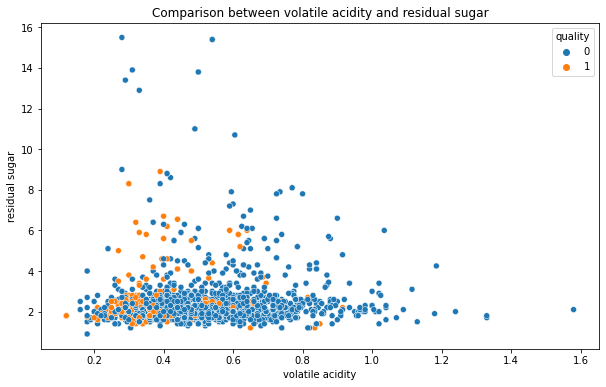

In [93]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and residual sugar')
sns.scatterplot(dfWine['volatile acidity'], dfWine['residual sugar'],hue = dfWine['quality']);

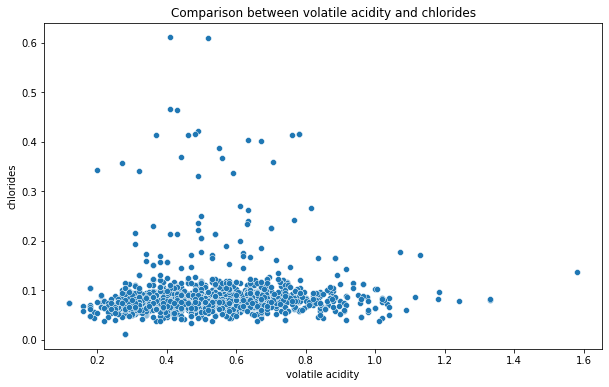

In [94]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and chlorides')
sns.scatterplot(dfWine['volatile acidity'], dfWine['chlorides']);

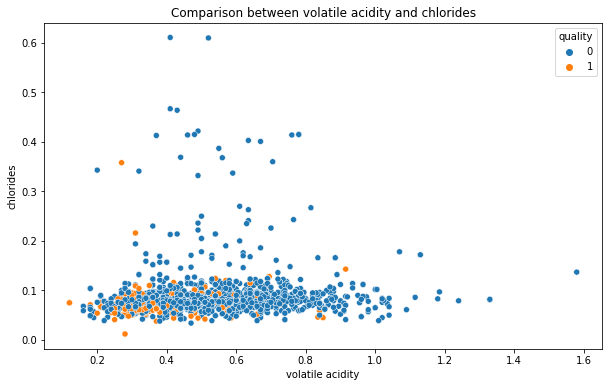

In [95]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and chlorides')
sns.scatterplot(dfWine['volatile acidity'], dfWine['chlorides'], hue = dfWine['quality']);

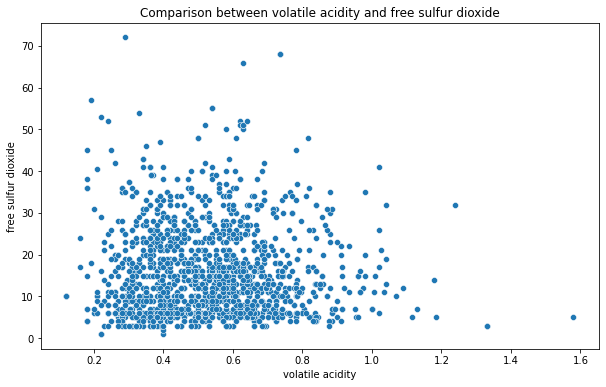

In [96]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and free sulfur dioxide')
sns.scatterplot(dfWine['volatile acidity'], dfWine['free sulfur dioxide']);

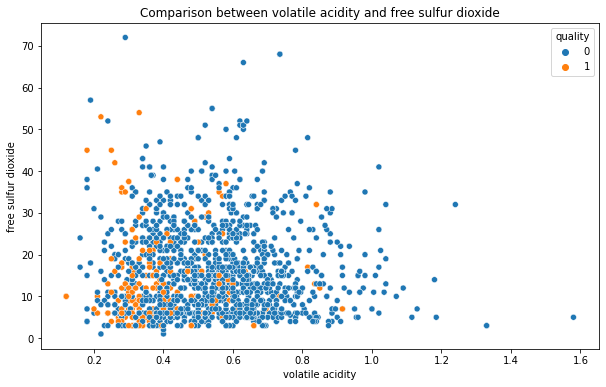

In [97]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and free sulfur dioxide')
sns.scatterplot(dfWine['volatile acidity'], dfWine['free sulfur dioxide'], hue = dfWine['quality']);

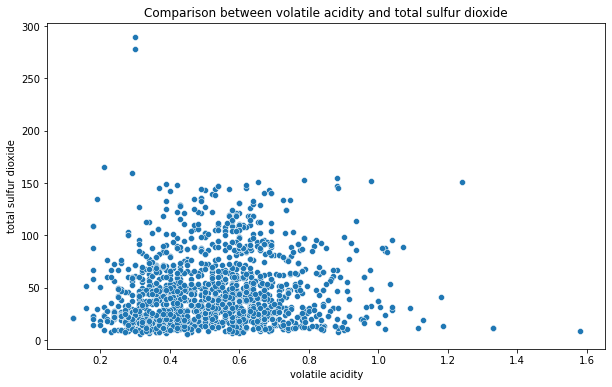

In [98]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and total sulfur dioxide')
sns.scatterplot(dfWine['volatile acidity'], dfWine['total sulfur dioxide']);

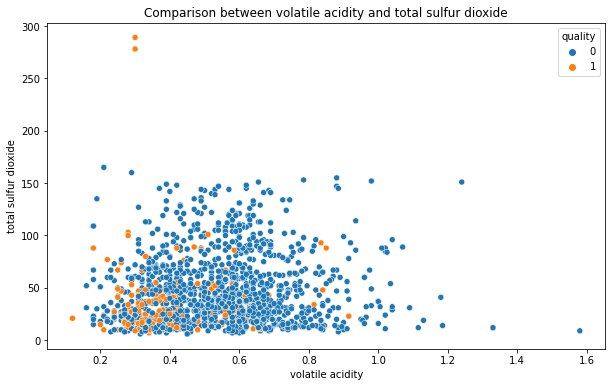

In [99]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and total sulfur dioxide')
sns.scatterplot(dfWine['volatile acidity'], dfWine['total sulfur dioxide'], dfWine['quality']);

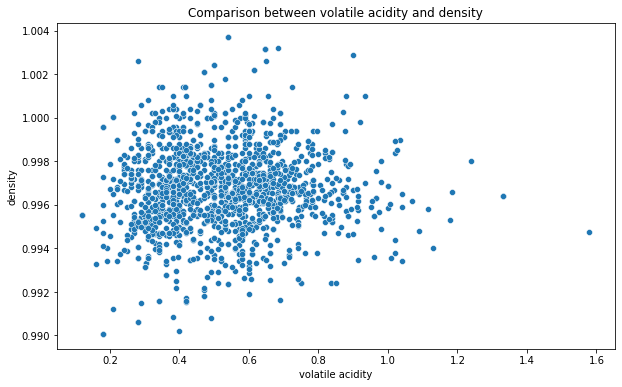

In [100]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and density')
sns.scatterplot(dfWine['volatile acidity'], dfWine['density']);

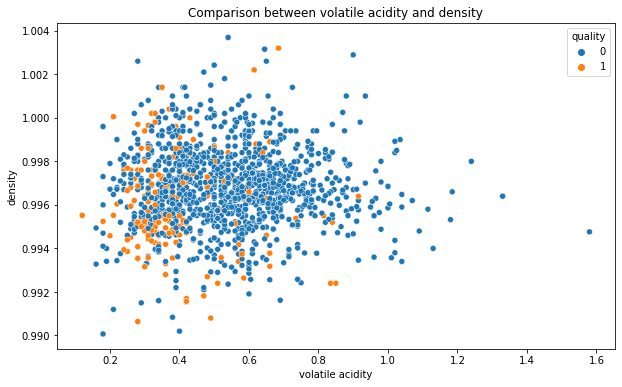

In [101]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and density')
sns.scatterplot(dfWine['volatile acidity'], dfWine['density'], hue = dfWine['quality']);

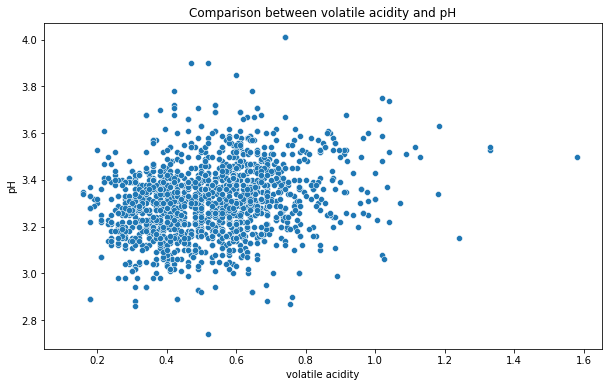

In [102]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and pH')
sns.scatterplot(dfWine['volatile acidity'], dfWine['pH']);

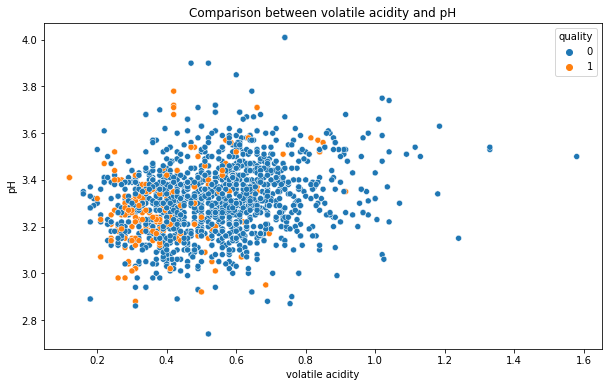

In [103]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and pH')
sns.scatterplot(dfWine['volatile acidity'], dfWine['pH'], hue = dfWine['quality']);

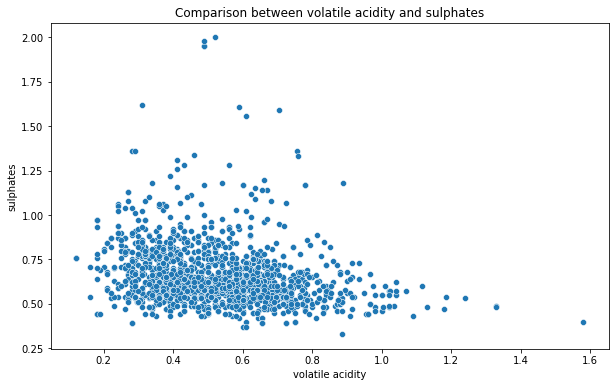

In [104]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and sulphates')
sns.scatterplot(dfWine['volatile acidity'], dfWine['sulphates']);

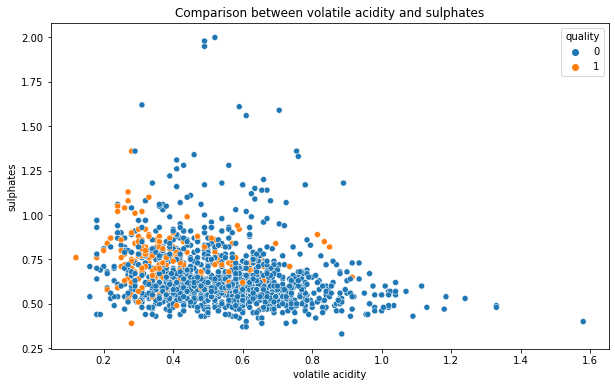

In [105]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and sulphates')
sns.scatterplot(dfWine['volatile acidity'], dfWine['sulphates'], hue = dfWine['quality']);

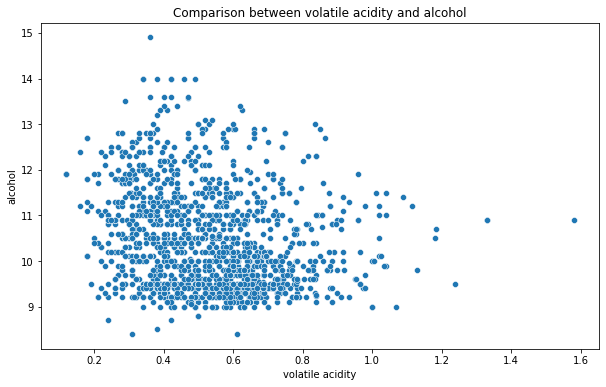

In [106]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and alcohol')
sns.scatterplot(dfWine['volatile acidity'], dfWine['alcohol']);

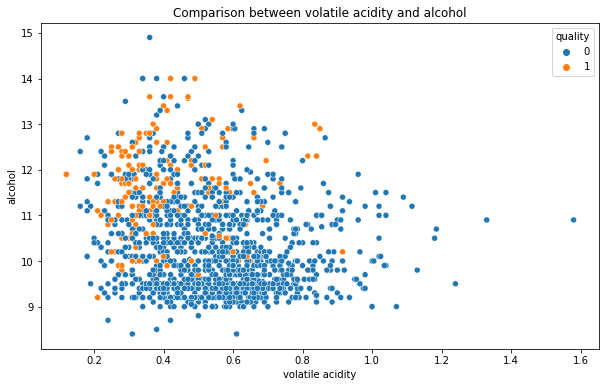

In [107]:
plt.figure(figsize=[10,6])
plt.title('Comparison between volatile acidity and alcohol')
sns.scatterplot(dfWine['volatile acidity'], dfWine['alcohol'], hue = dfWine['quality']);

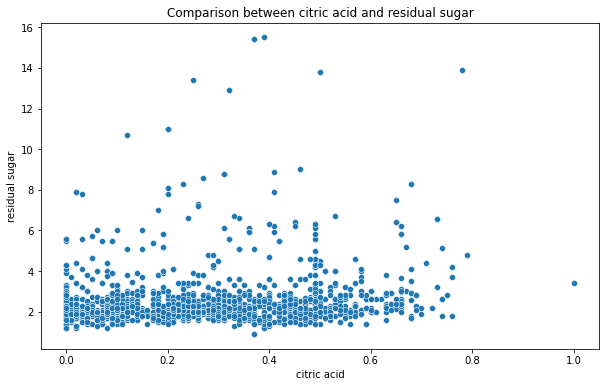

In [108]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and residual sugar')
sns.scatterplot(dfWine['citric acid'], dfWine['residual sugar']);

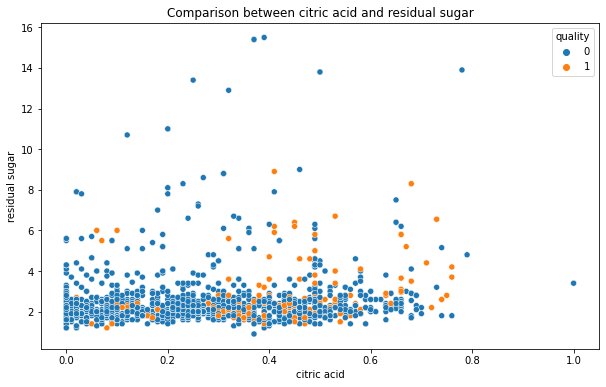

In [109]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and residual sugar')
sns.scatterplot(dfWine['citric acid'], dfWine['residual sugar'], hue = dfWine['quality']);

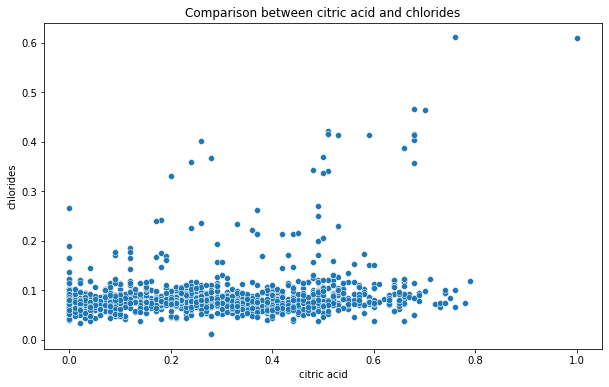

In [110]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and chlorides')
sns.scatterplot(dfWine['citric acid'], dfWine['chlorides']);

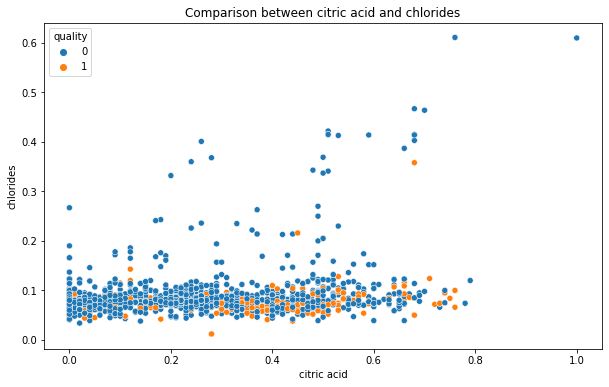

In [111]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and chlorides')
sns.scatterplot(dfWine['citric acid'], dfWine['chlorides'], hue = dfWine['quality']);

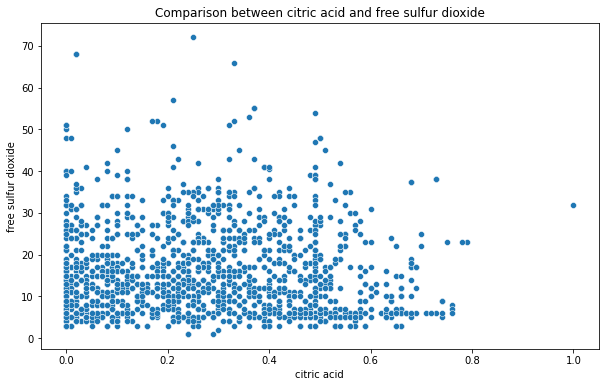

In [112]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and free sulfur dioxide')
sns.scatterplot(dfWine['citric acid'], dfWine['free sulfur dioxide']);

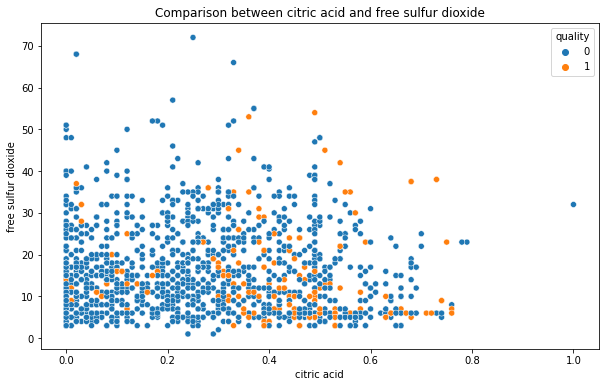

In [113]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and free sulfur dioxide')
sns.scatterplot(dfWine['citric acid'], dfWine['free sulfur dioxide'], hue = dfWine['quality']);

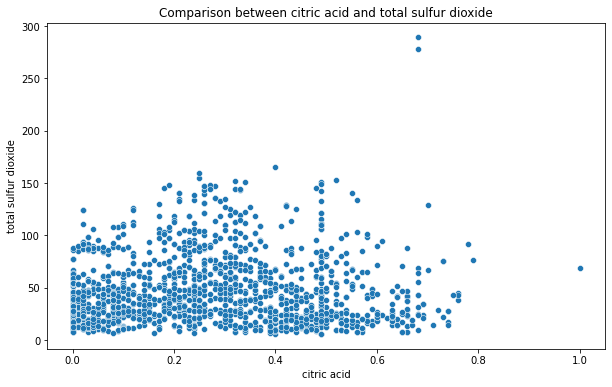

In [114]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and total sulfur dioxide')
sns.scatterplot(dfWine['citric acid'], dfWine['total sulfur dioxide']);

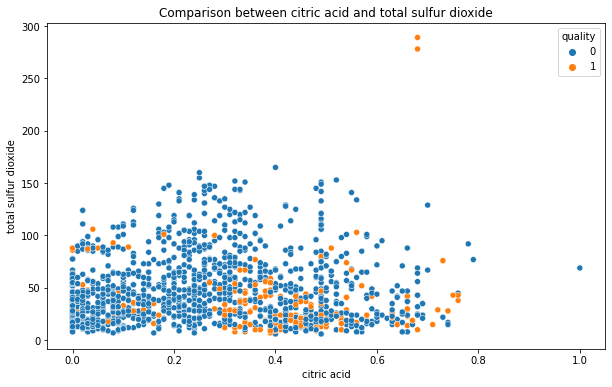

In [115]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and total sulfur dioxide')
sns.scatterplot(dfWine['citric acid'], dfWine['total sulfur dioxide'], hue = dfWine['quality']);

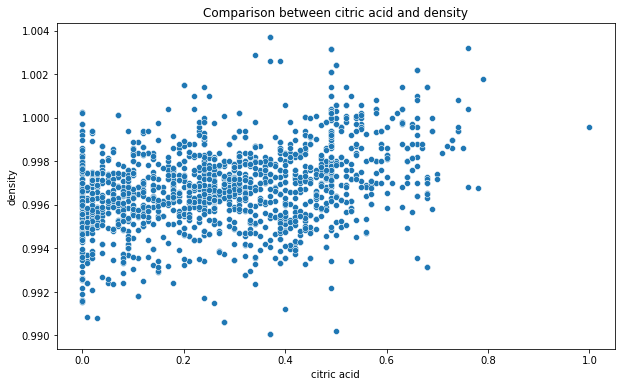

In [116]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and density')
sns.scatterplot(dfWine['citric acid'], dfWine['density']);

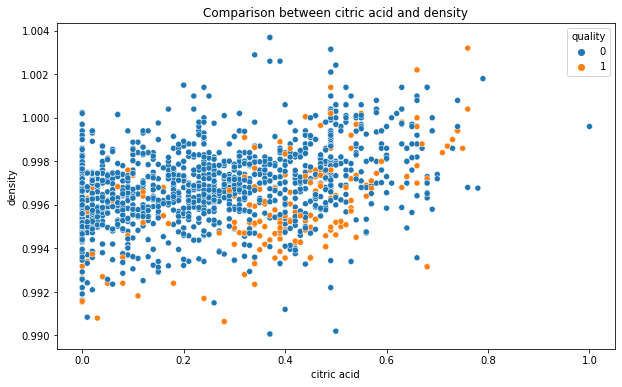

In [117]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and density')
sns.scatterplot(dfWine['citric acid'], dfWine['density'], hue = dfWine['quality']);

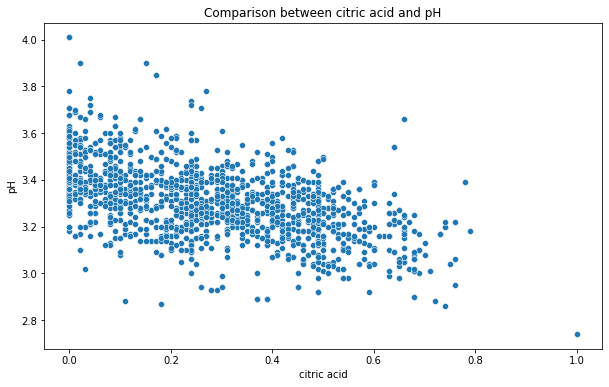

In [118]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and pH')
sns.scatterplot(dfWine['citric acid'], dfWine['pH']);

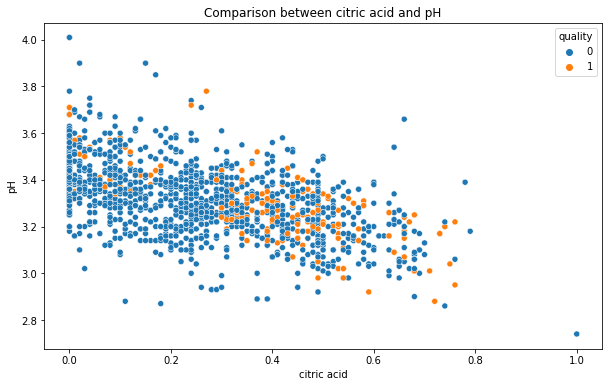

In [119]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and pH')
sns.scatterplot(dfWine['citric acid'], dfWine['pH'], hue = dfWine['quality']);

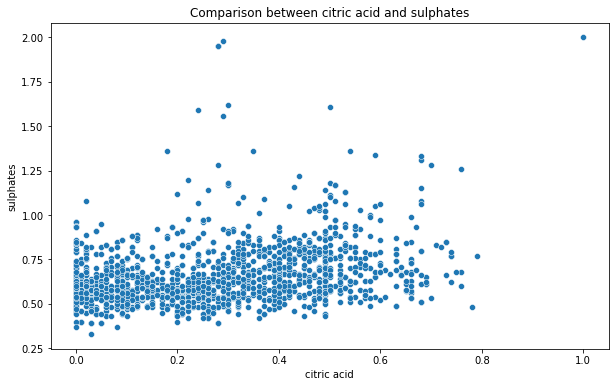

In [120]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and sulphates')
sns.scatterplot(dfWine['citric acid'], dfWine['sulphates']);

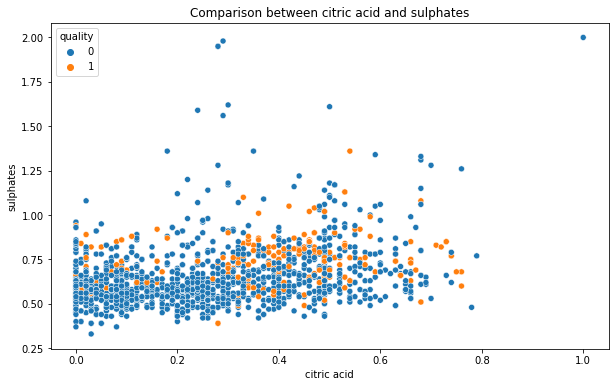

In [121]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and sulphates')
sns.scatterplot(dfWine['citric acid'], dfWine['sulphates'], hue = dfWine['quality']);

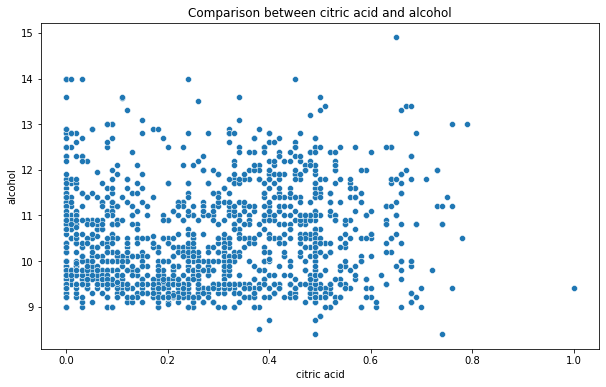

In [122]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and alcohol')
sns.scatterplot(dfWine['citric acid'], dfWine['alcohol']);

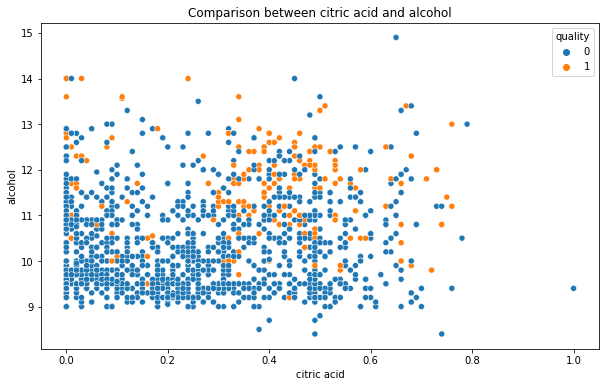

In [123]:
plt.figure(figsize=[10,6])
plt.title('Comparison between citric acid and alcohol')
sns.scatterplot(dfWine['citric acid'], dfWine['alcohol'], hue = dfWine['quality']);

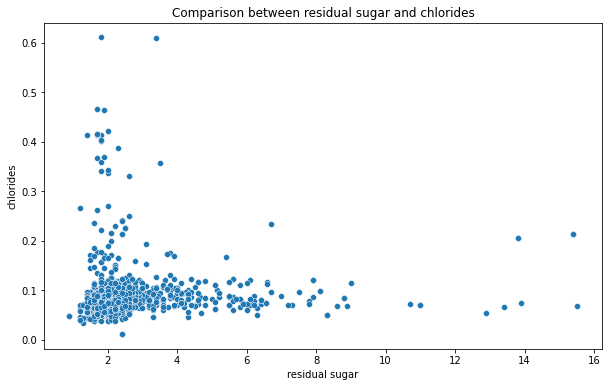

In [124]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and chlorides')
sns.scatterplot(dfWine['residual sugar'], dfWine['chlorides']);

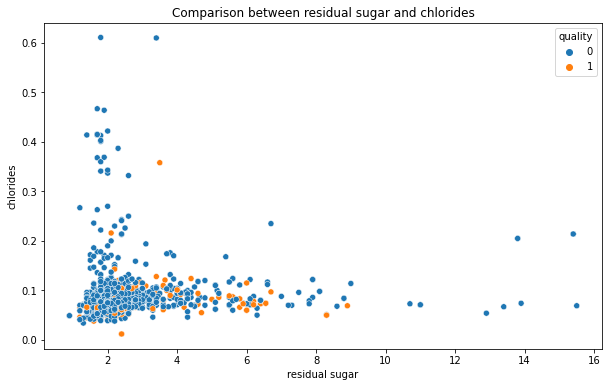

In [125]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and chlorides')
sns.scatterplot(dfWine['residual sugar'], dfWine['chlorides'], hue = dfWine['quality']);

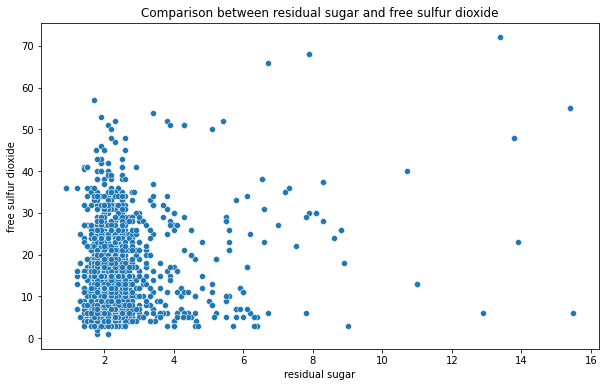

In [126]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and free sulfur dioxide')
sns.scatterplot(dfWine['residual sugar'], dfWine['free sulfur dioxide']);  

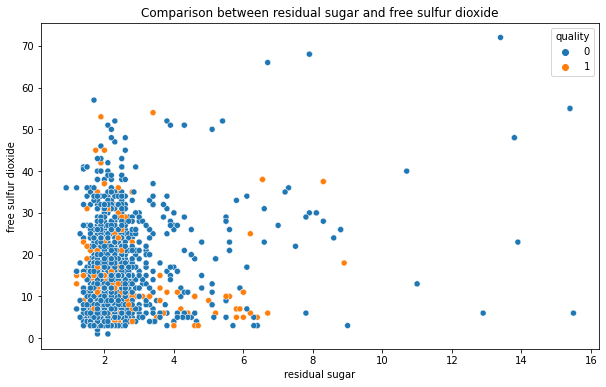

In [127]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and free sulfur dioxide')
sns.scatterplot(dfWine['residual sugar'], dfWine['free sulfur dioxide'], hue = dfWine['quality']); 

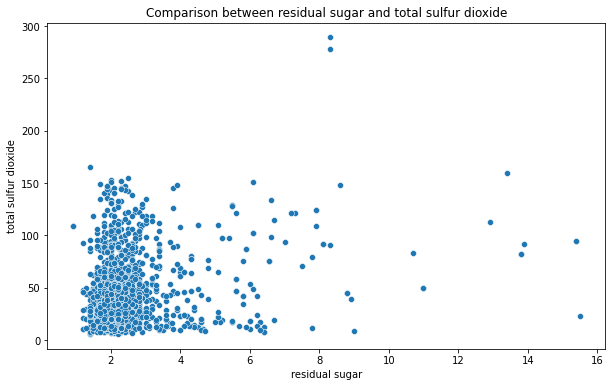

In [128]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and total sulfur dioxide')
sns.scatterplot(dfWine['residual sugar'], dfWine['total sulfur dioxide']); 

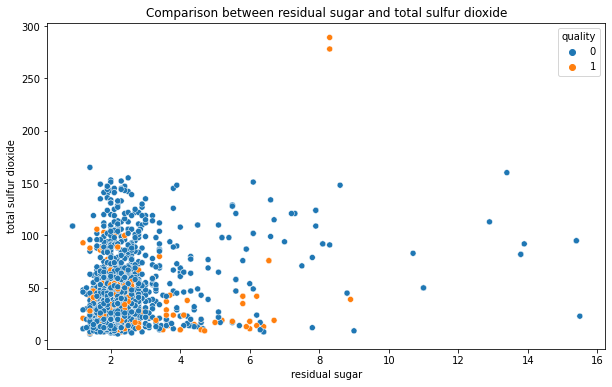

In [129]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and total sulfur dioxide')
sns.scatterplot(dfWine['residual sugar'], dfWine['total sulfur dioxide'], hue = dfWine['quality']); 

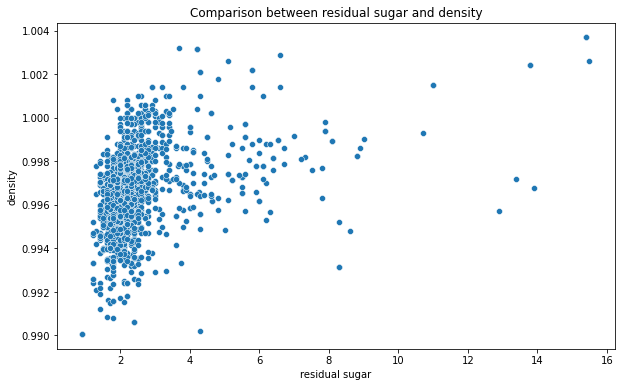

In [130]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and density')
sns.scatterplot(dfWine['residual sugar'], dfWine['density']); 

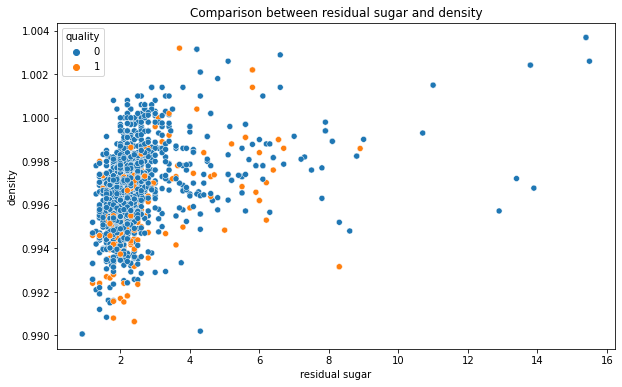

In [131]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and density')
sns.scatterplot(dfWine['residual sugar'], dfWine['density'], hue = dfWine['quality']); 

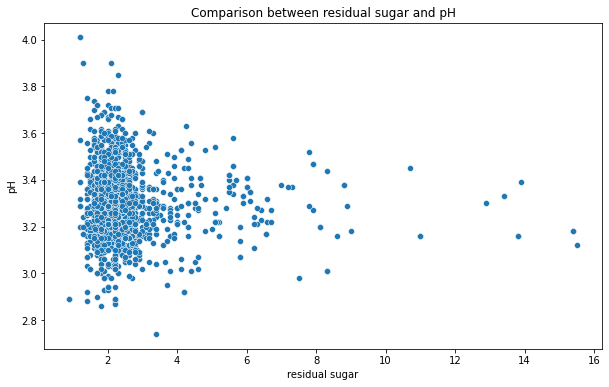

In [132]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and pH')
sns.scatterplot(dfWine['residual sugar'], dfWine['pH']); 

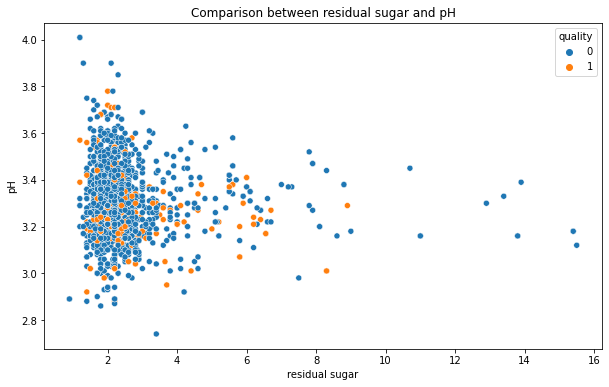

In [133]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and pH')
sns.scatterplot(dfWine['residual sugar'], dfWine['pH'], hue = dfWine['quality']);

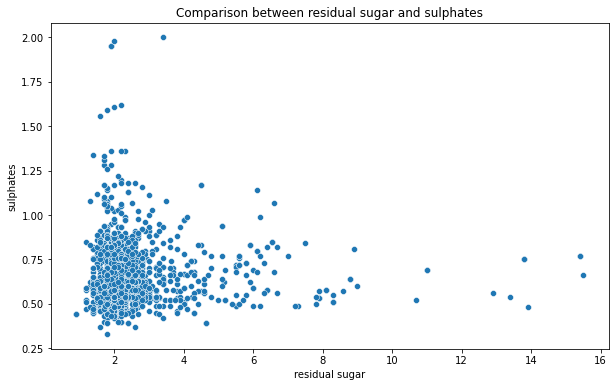

In [134]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and sulphates')
sns.scatterplot(dfWine['residual sugar'], dfWine['sulphates']);

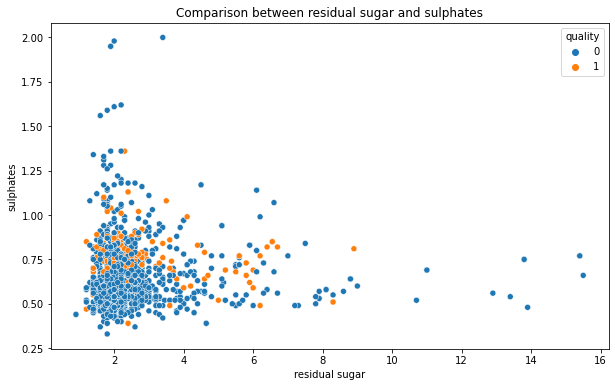

In [135]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and sulphates')
sns.scatterplot(dfWine['residual sugar'], dfWine['sulphates'], hue = dfWine['quality']);

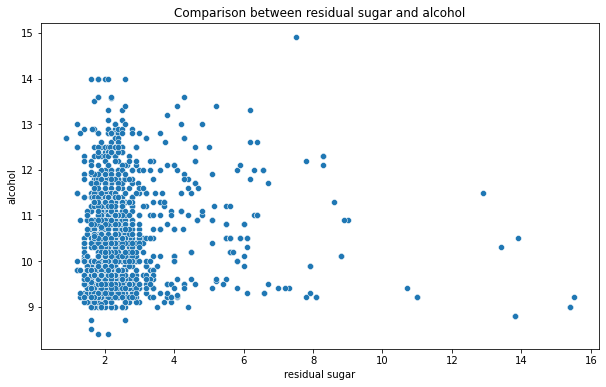

In [136]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and alcohol')
sns.scatterplot(dfWine['residual sugar'], dfWine['alcohol']);

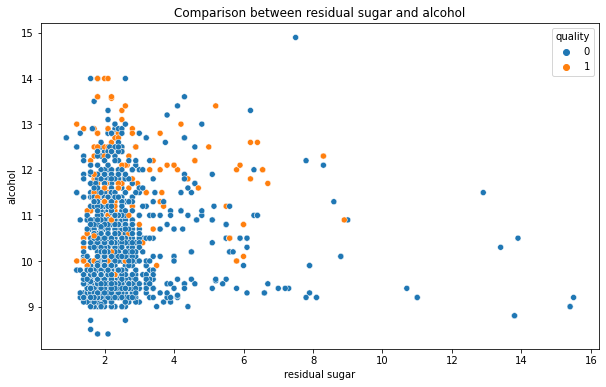

In [137]:
plt.figure(figsize=[10,6])
plt.title('Comparison between residual sugar and alcohol')
sns.scatterplot(dfWine['residual sugar'], dfWine['alcohol'], hue = dfWine['quality']);

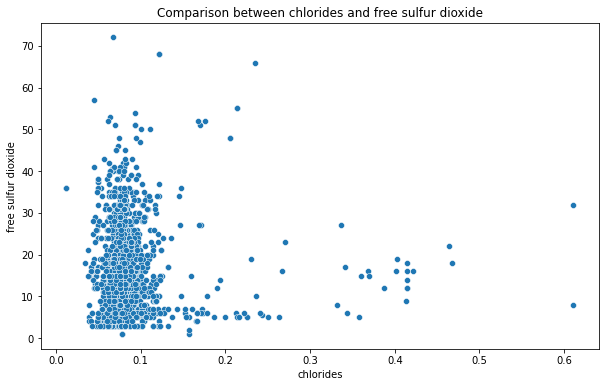

In [138]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and free sulfur dioxide')
sns.scatterplot(dfWine['chlorides'], dfWine['free sulfur dioxide']);

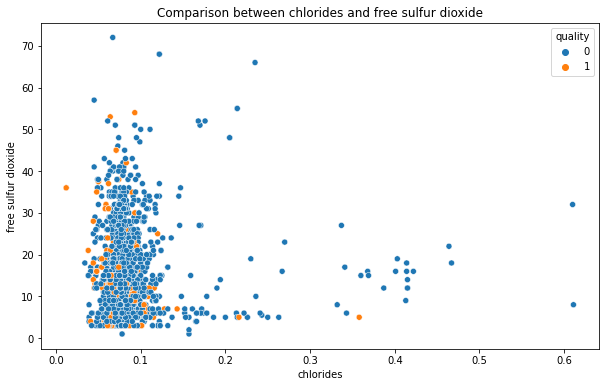

In [139]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and free sulfur dioxide')
sns.scatterplot(dfWine['chlorides'], dfWine['free sulfur dioxide'], hue = dfWine['quality']);

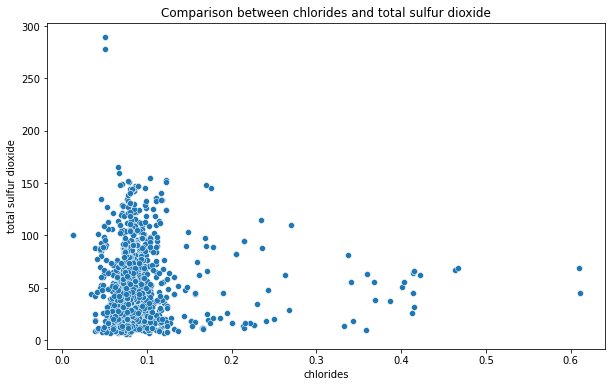

In [140]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and total sulfur dioxide')
sns.scatterplot(dfWine['chlorides'], dfWine['total sulfur dioxide']);

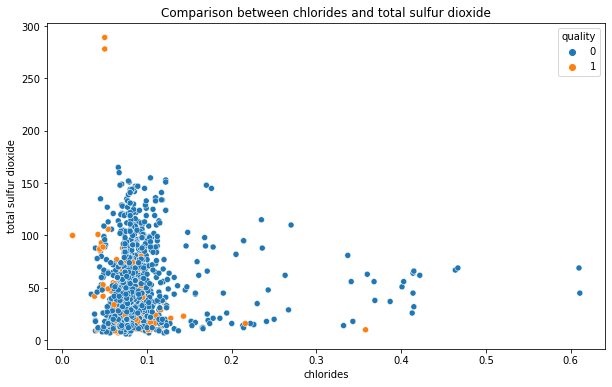

In [141]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and total sulfur dioxide')
sns.scatterplot(dfWine['chlorides'], dfWine['total sulfur dioxide'], hue = dfWine['quality']);

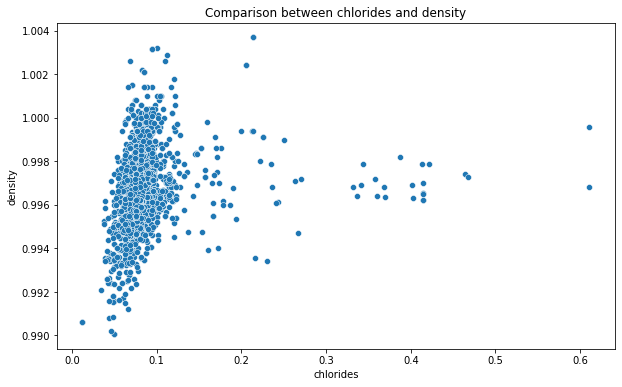

In [142]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and density')
sns.scatterplot(dfWine['chlorides'], dfWine['density']);

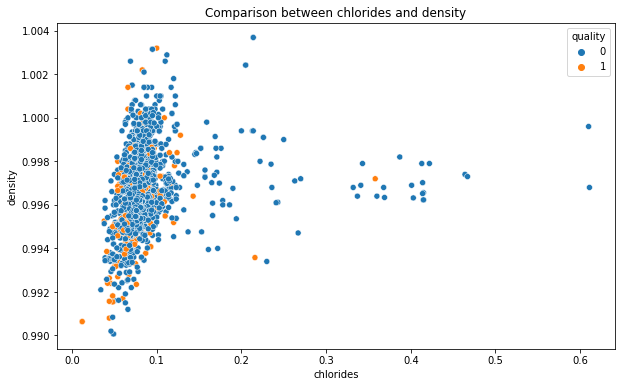

In [143]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and density')
sns.scatterplot(dfWine['chlorides'], dfWine['density'], hue = dfWine['quality']);

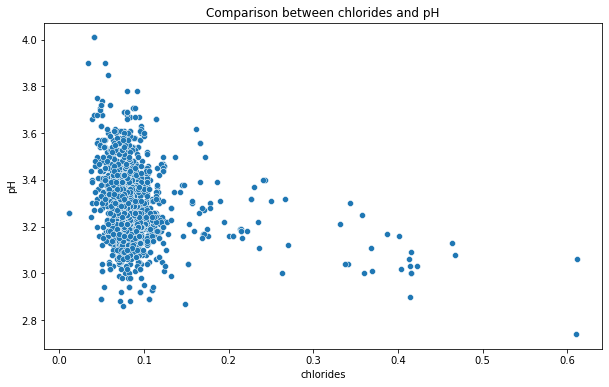

In [144]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and pH')
sns.scatterplot(dfWine['chlorides'], dfWine['pH']);

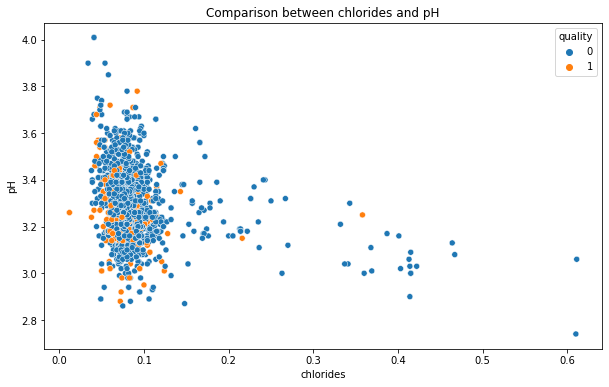

In [145]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and pH')
sns.scatterplot(dfWine['chlorides'], dfWine['pH'], hue = dfWine['quality']);

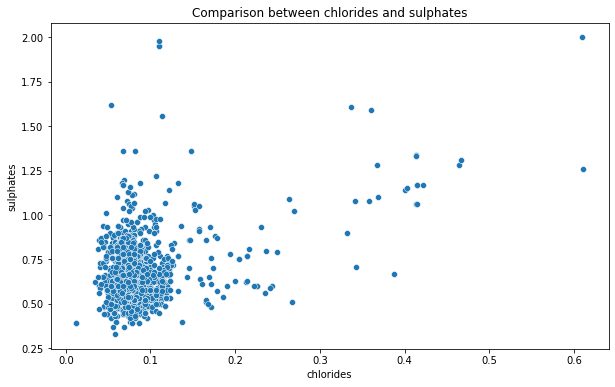

In [146]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and sulphates')
sns.scatterplot(dfWine['chlorides'], dfWine['sulphates']);

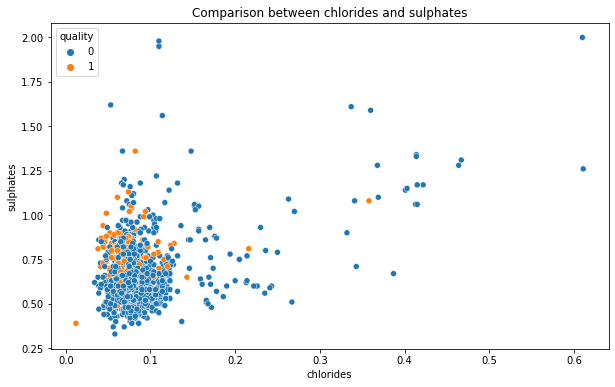

In [147]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and sulphates')
sns.scatterplot(dfWine['chlorides'], dfWine['sulphates'], hue = dfWine['quality']);

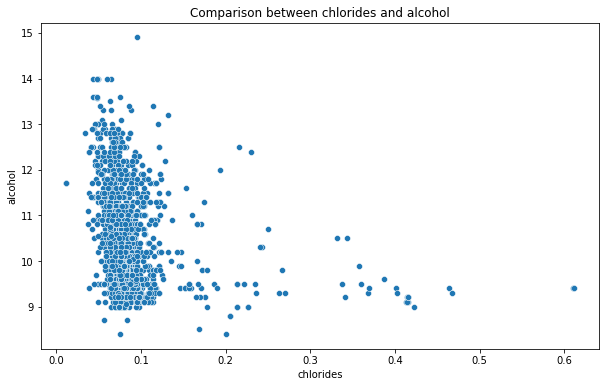

In [148]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and alcohol')
sns.scatterplot(dfWine['chlorides'], dfWine['alcohol']);

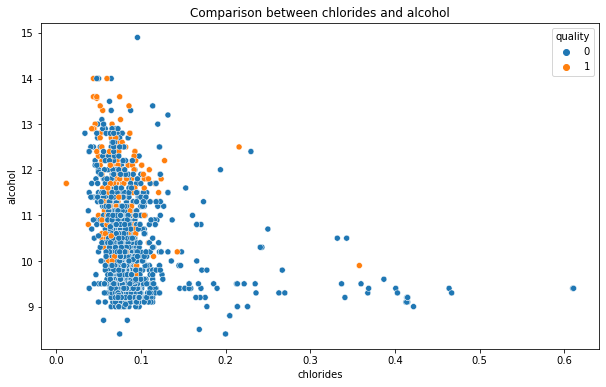

In [149]:
plt.figure(figsize=[10,6])
plt.title('Comparison between chlorides and alcohol')
sns.scatterplot(dfWine['chlorides'], dfWine['alcohol'], hue = dfWine['quality']);

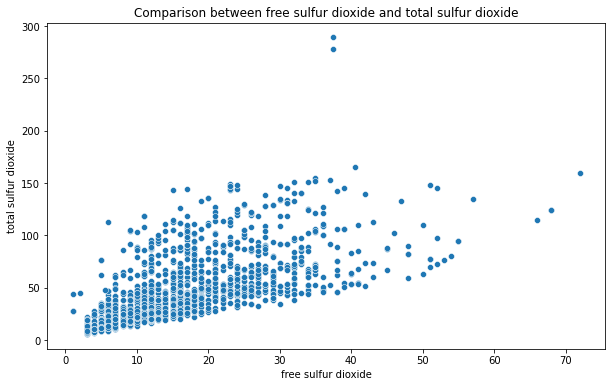

In [150]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and total sulfur dioxide')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['total sulfur dioxide']);

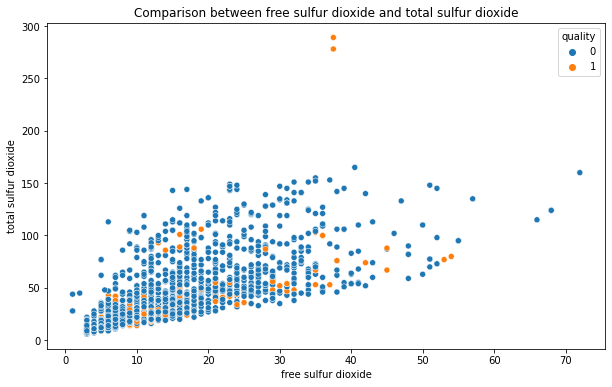

In [151]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and total sulfur dioxide')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['total sulfur dioxide'], hue = dfWine['quality']);

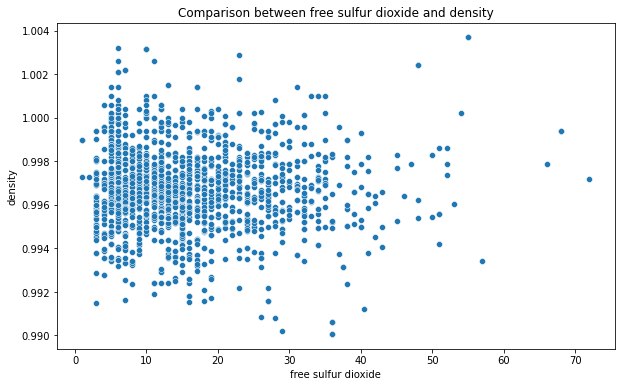

In [152]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and density')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['density']);

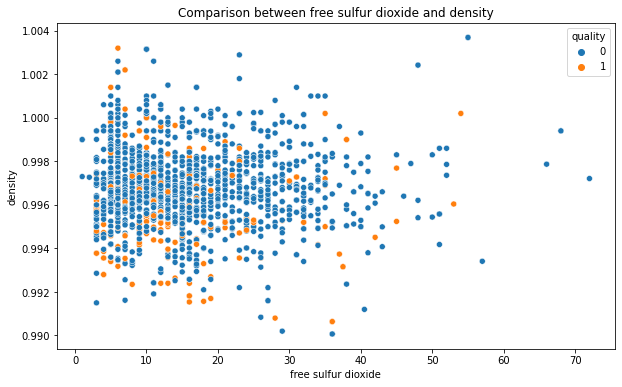

In [153]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and density')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['density'], hue = dfWine['quality']);

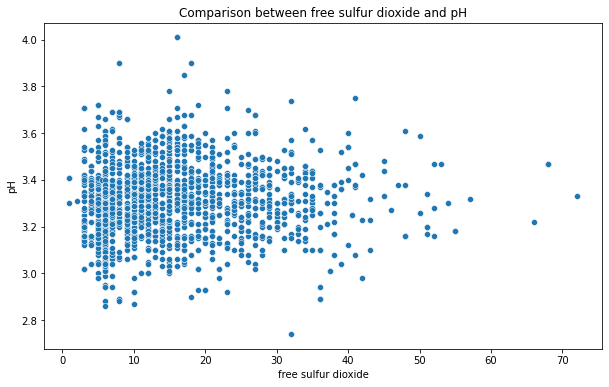

In [154]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and pH')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['pH']);

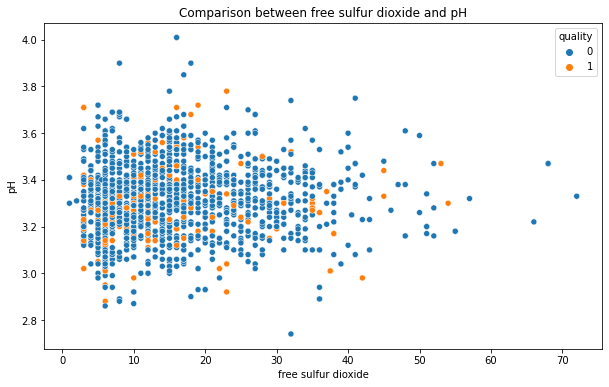

In [155]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and pH')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['pH'], hue = dfWine['quality']);

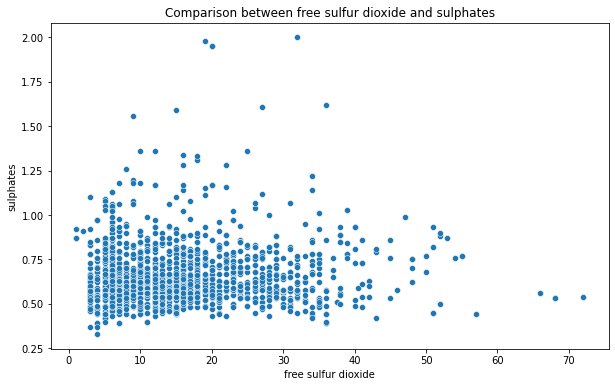

In [156]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and sulphates')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['sulphates']);

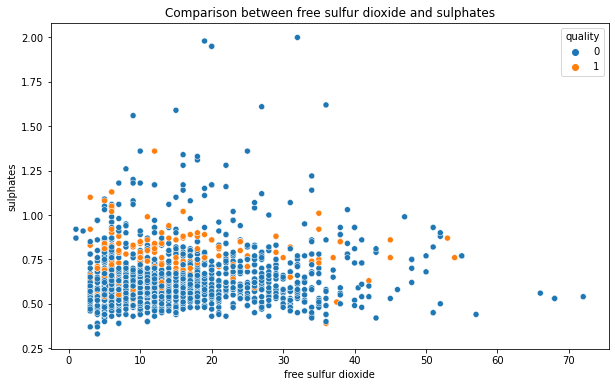

In [157]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and sulphates')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['sulphates'], hue = dfWine['quality']);

<AxesSubplot:title={'center':'Comparison between free sulfur dioxide and alcohol'}, xlabel='free sulfur dioxide', ylabel='alcohol'>

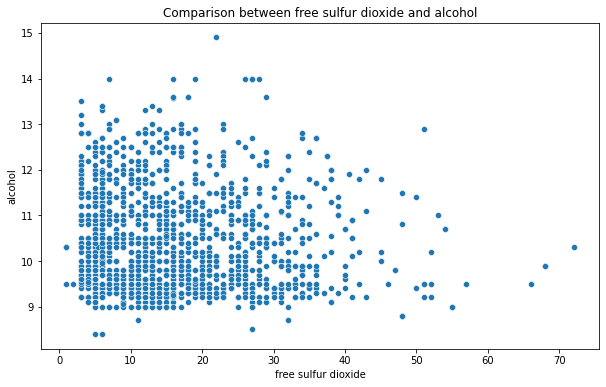

In [158]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and alcohol')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['alcohol'])

<AxesSubplot:title={'center':'Comparison between free sulfur dioxide and alcohol'}, xlabel='free sulfur dioxide', ylabel='alcohol'>

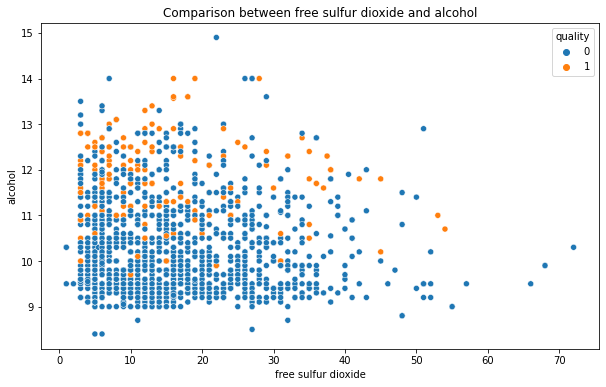

In [159]:
plt.figure(figsize=[10,6])
plt.title('Comparison between free sulfur dioxide and alcohol')
sns.scatterplot(dfWine['free sulfur dioxide'], dfWine['alcohol'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and density'}, xlabel='total sulfur dioxide', ylabel='density'>

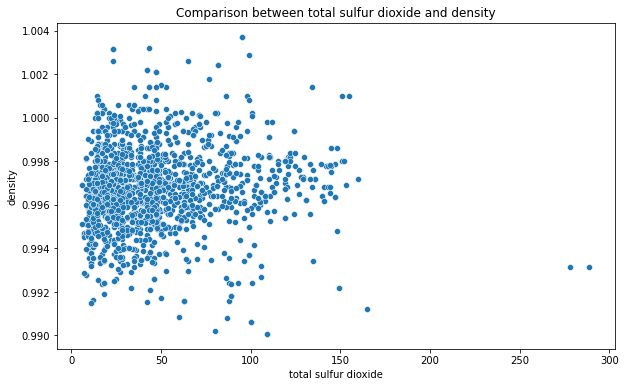

In [160]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and density')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['density'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and density'}, xlabel='total sulfur dioxide', ylabel='density'>

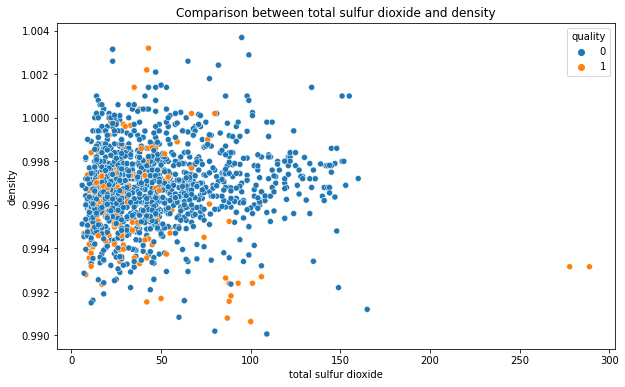

In [161]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and density')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['density'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and pH'}, xlabel='total sulfur dioxide', ylabel='pH'>

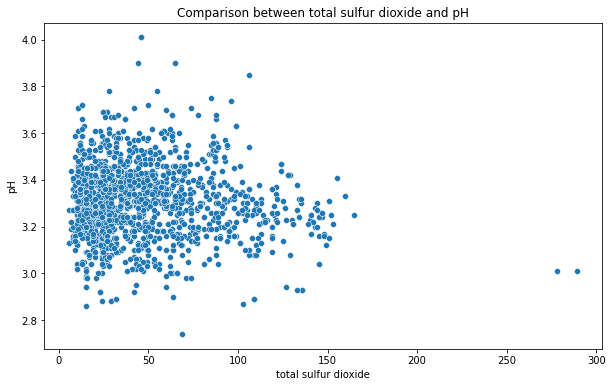

In [162]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and pH')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['pH'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and pH'}, xlabel='total sulfur dioxide', ylabel='pH'>

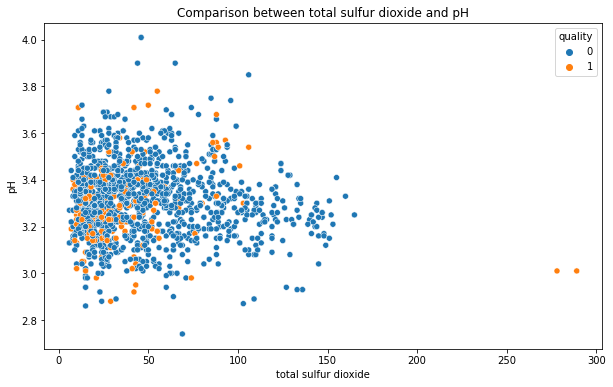

In [163]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and pH')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['pH'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and sulphates'}, xlabel='total sulfur dioxide', ylabel='sulphates'>

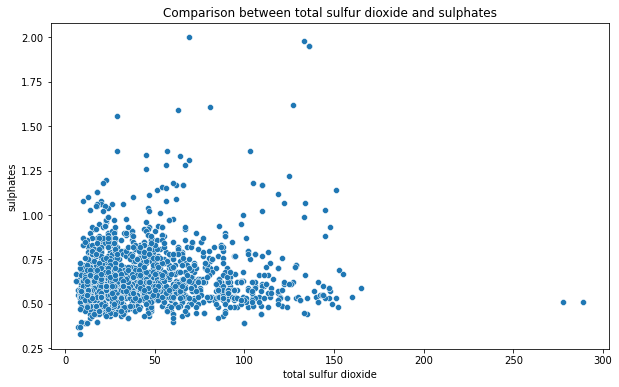

In [164]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and sulphates')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['sulphates'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and sulphates'}, xlabel='total sulfur dioxide', ylabel='sulphates'>

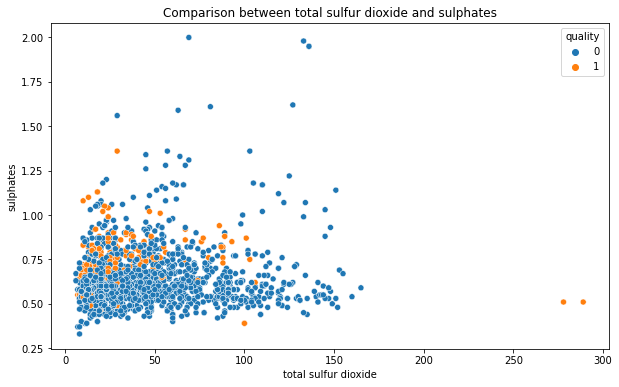

In [165]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and sulphates')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['sulphates'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and alcohol'}, xlabel='total sulfur dioxide', ylabel='alcohol'>

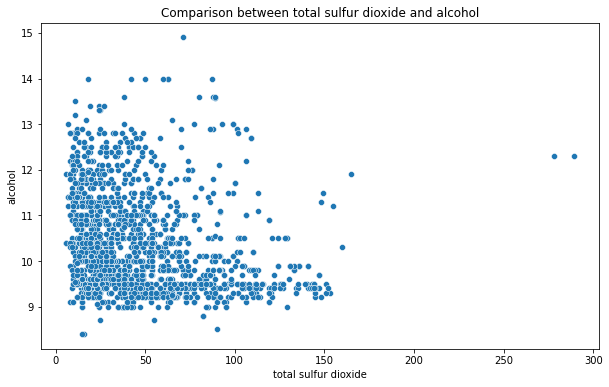

In [166]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and alcohol')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['alcohol'])

<AxesSubplot:title={'center':'Comparison between total sulfur dioxide and alcohol'}, xlabel='total sulfur dioxide', ylabel='alcohol'>

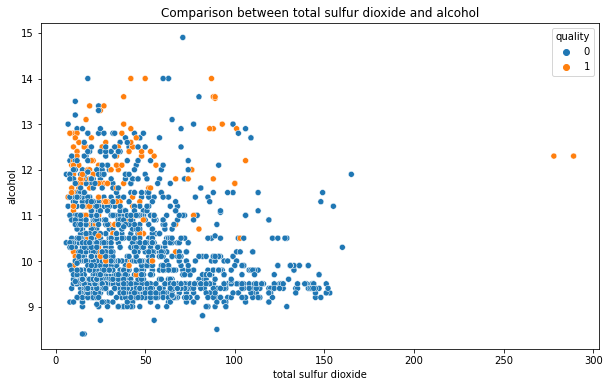

In [167]:
plt.figure(figsize=[10,6])
plt.title('Comparison between total sulfur dioxide and alcohol')
sns.scatterplot(dfWine['total sulfur dioxide'], dfWine['alcohol'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between density and pH'}, xlabel='density', ylabel='pH'>

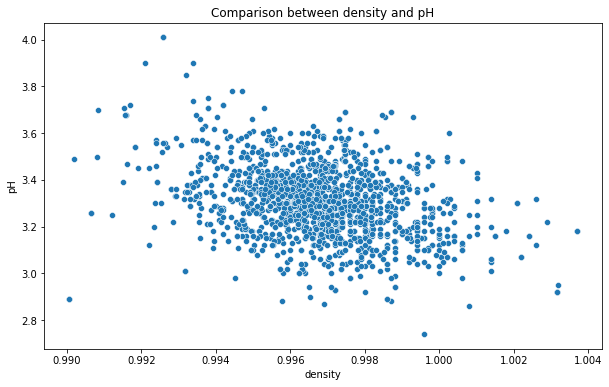

In [168]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and pH')
sns.scatterplot(dfWine['density'], dfWine['pH'])

<AxesSubplot:title={'center':'Comparison between density and pH'}, xlabel='density', ylabel='pH'>

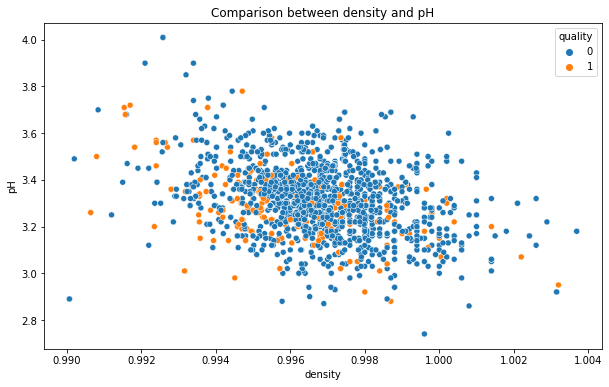

In [169]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and pH')
sns.scatterplot(dfWine['density'], dfWine['pH'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between density and sulphates'}, xlabel='density', ylabel='sulphates'>

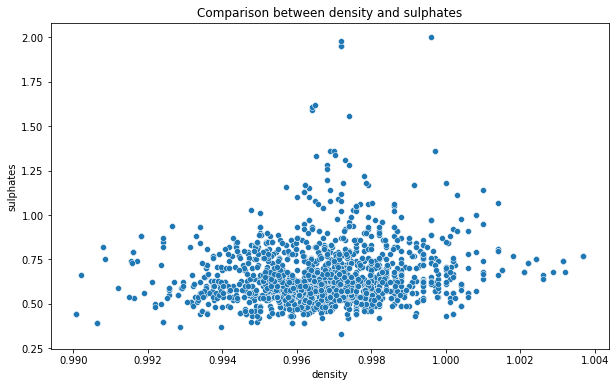

In [170]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and sulphates')
sns.scatterplot(dfWine['density'], dfWine['sulphates'])

<AxesSubplot:title={'center':'Comparison between density and sulphates'}, xlabel='density', ylabel='sulphates'>

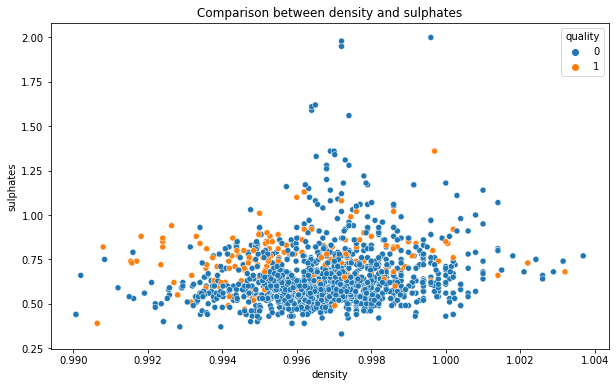

In [171]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and sulphates')
sns.scatterplot(dfWine['density'], dfWine['sulphates'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between density and alcohol'}, xlabel='density', ylabel='alcohol'>

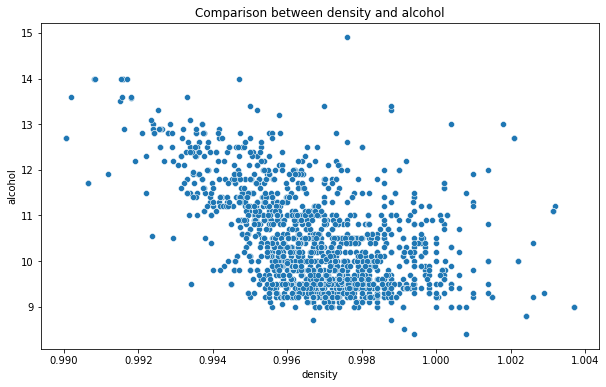

In [172]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and alcohol')
sns.scatterplot(dfWine['density'], dfWine['alcohol'])

<AxesSubplot:title={'center':'Comparison between density and alcohol'}, xlabel='density', ylabel='alcohol'>

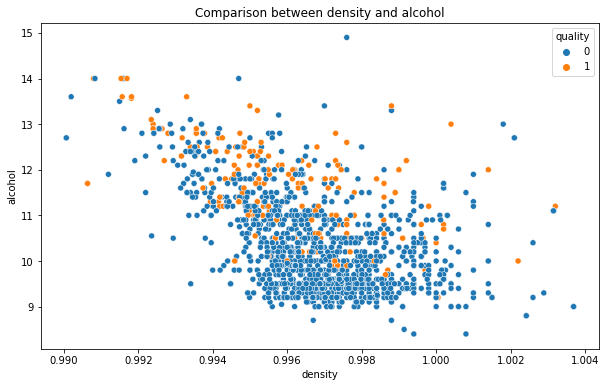

In [173]:
plt.figure(figsize=[10,6])
plt.title('Comparison between density and alcohol')
sns.scatterplot(dfWine['density'], dfWine['alcohol'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between pH and sulphates'}, xlabel='pH', ylabel='sulphates'>

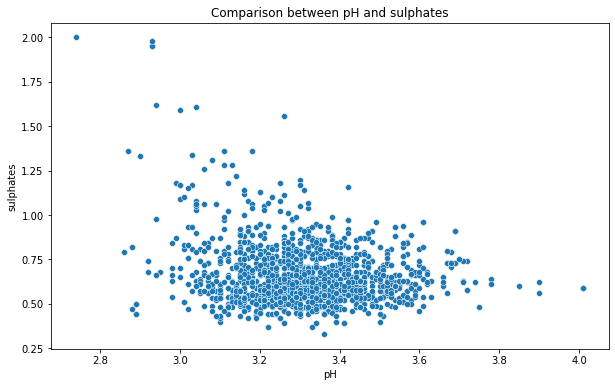

In [174]:
plt.figure(figsize=[10,6])
plt.title('Comparison between pH and sulphates')
sns.scatterplot(dfWine['pH'], dfWine['sulphates'])

<AxesSubplot:title={'center':'Comparison between pH and sulphates'}, xlabel='pH', ylabel='sulphates'>

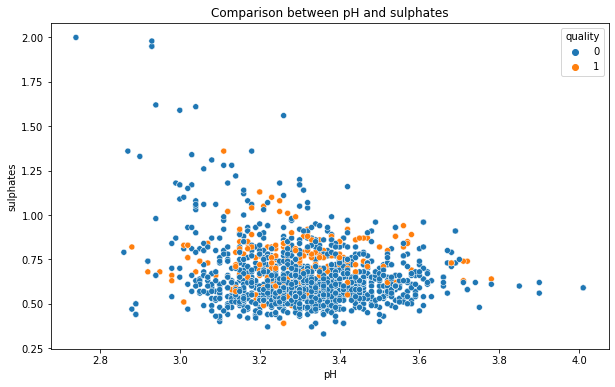

In [175]:
plt.figure(figsize=[10,6])
plt.title('Comparison between pH and sulphates')
sns.scatterplot(dfWine['pH'], dfWine['sulphates'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between pH and alcohol'}, xlabel='pH', ylabel='alcohol'>

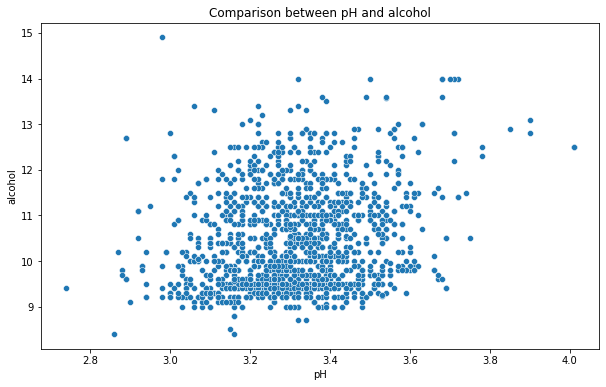

In [176]:
plt.figure(figsize=[10,6])
plt.title('Comparison between pH and alcohol')
sns.scatterplot(dfWine['pH'], dfWine['alcohol'])

<AxesSubplot:title={'center':'Comparison between pH and alcohol'}, xlabel='pH', ylabel='alcohol'>

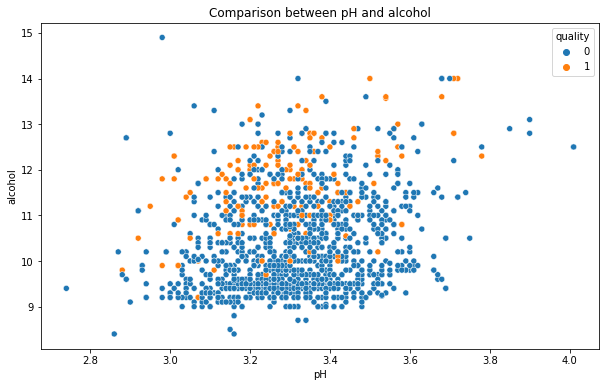

In [177]:
plt.figure(figsize=[10,6])
plt.title('Comparison between pH and alcohol')
sns.scatterplot(dfWine['pH'], dfWine['alcohol'], hue = dfWine['quality'])

<AxesSubplot:title={'center':'Comparison between sulphates and alcohol'}, xlabel='sulphates', ylabel='alcohol'>

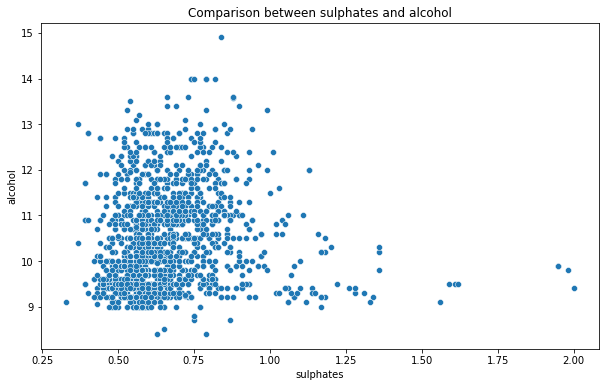

In [178]:
plt.figure(figsize=[10,6])
plt.title('Comparison between sulphates and alcohol')
sns.scatterplot(dfWine['sulphates'], dfWine['alcohol'])

<AxesSubplot:title={'center':'Comparison between sulphates and alcohol'}, xlabel='sulphates', ylabel='alcohol'>

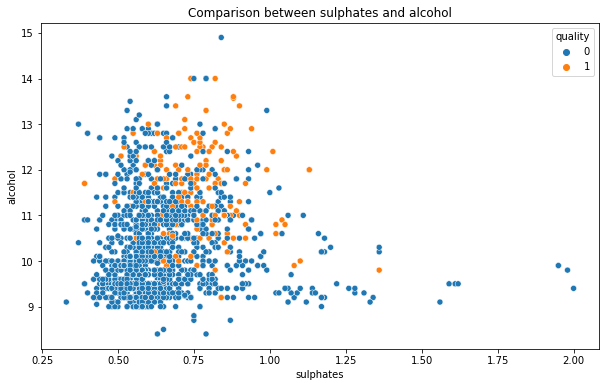

In [179]:
plt.figure(figsize=[10,6])
plt.title('Comparison between sulphates and alcohol')
sns.scatterplot(dfWine['sulphates'], dfWine['alcohol'], hue = dfWine['quality'])

Multivariate Analysis

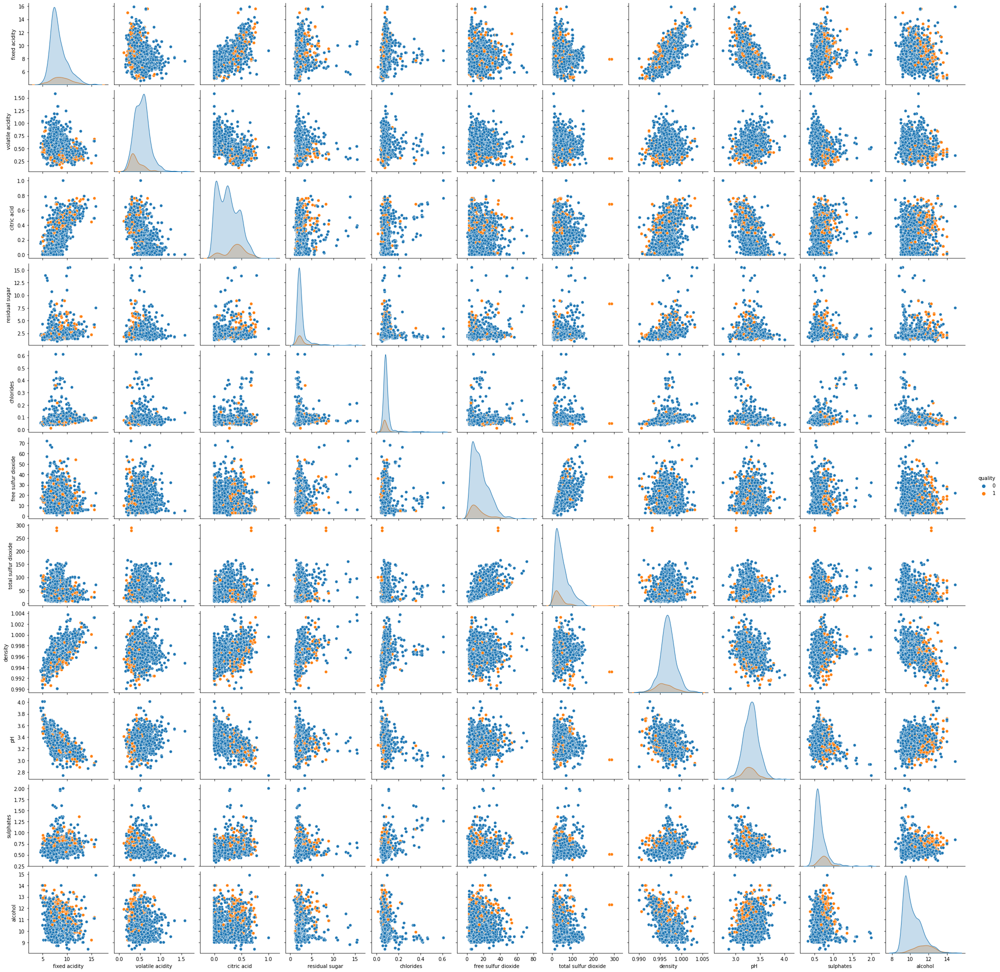

In [180]:
sns.pairplot(dfWine,hue = 'quality')

In [181]:
dfWine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,0.135710
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.342587
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,0.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,0.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,0.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,0.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,1.000000


Under free sulfur dioxide and total sulfur dioxide the standard deviation is very high that means flat graph... the graph is spreaded. 

Under citric acid the mean is 0.27 and std is 0.19 which is very less, so here we have high peak graph and data is less spreaded.

Under fixed acidity, we analyses that the mean is 8.3 and median (50 percentile) is 7.9, so mean>median which means we have little skewness, right tail skew..

Under residual sugar, free sulphur dioxide and total sulphur dioxide there is huge difference between 75 percentile and max value, so extreme outliers are present.

In [182]:
# Checking correlation..
dfWineCorr = dfWine.corr()
dfWineCorr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.120061
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.270712
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.214716
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.047779
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.097308
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.071747
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.139517
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.150460
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057283
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.199485


<AxesSubplot:>

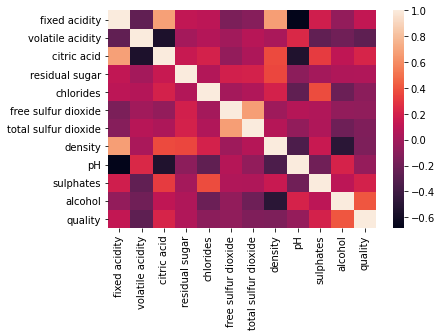

In [183]:
# Checking correlation using heatmap..
sns.heatmap(dfWineCorr)

Here, free sulfur dioxide and total sulfur dioxide are highly correlated with each other and shows postive relationship.

Quality and alcohol also showing the positive relationship. Whereas volatile acidity and citric acid shows negative relationship.



<AxesSubplot:>

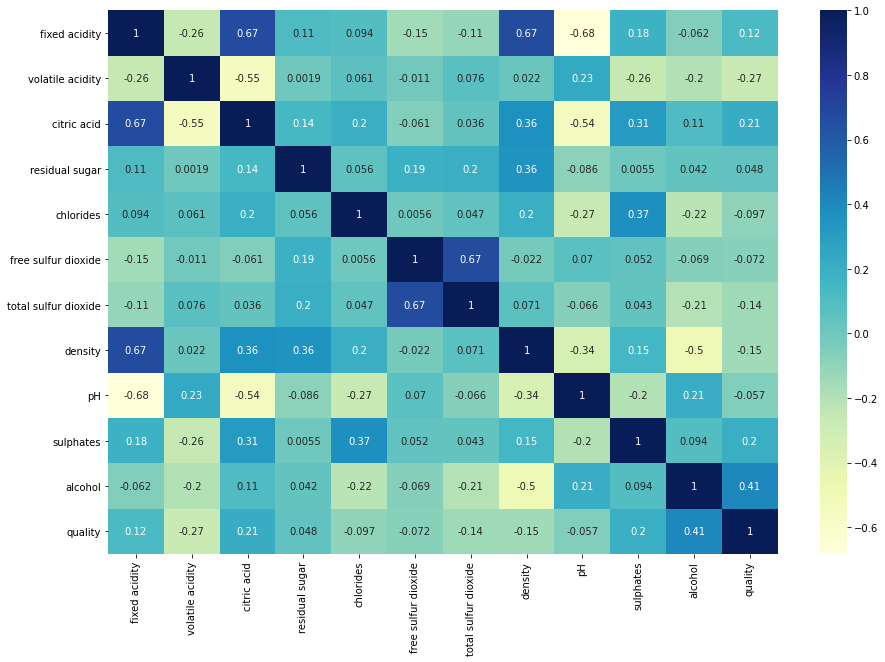

In [184]:
plt.figure(figsize=(15,10))
sns.heatmap(dfWineCorr,cmap='YlGnBu',annot=True)

#### Checking Multicollinearity

In [185]:
x.shape

(1599, 11)

In [186]:
x.shape[0]

1599

In [187]:
x.shape[1]

11

In [190]:
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [191]:
def calc_vif(x):
    vif = pd.DataFrame()
    vif['Variables'] = x.columns
    vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [192]:
calc_vif(x)

,Variables,VIF Factor
0,fixed acidity,74.452265
1,volatile acidity,17.060026
2,citric acid,9.183495
3,residual sugar,4.662992
4,chlorides,6.554877
5,free sulfur dioxide,6.442682
6,total sulfur dioxide,6.519699
7,density,1479.287209
8,pH,1070.967685
9,sulphates,21.590621


Here, we can see multicollinearity in density and pH through VIF. However, when we see heatmap the strongest relationship is present in free sulfur dioxide and total sulfur dioxide.
So, we will go with heatmap. Total sulfur dioxide is contributing more to target variable and free sulfur dioxide is contributing less to target variable. So, we will drop free sulfur dioxide.


In [280]:
dfWine.drop(['free sulfur dioxide'],axis=1,inplace=True)

In [281]:
dfWine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,34.0,0.99780,3.51,0.56,9.4,0
1,7.8,0.880,0.00,2.6,0.098,67.0,0.99680,3.20,0.68,9.8,0
2,7.8,0.760,0.04,2.3,0.092,54.0,0.99700,3.26,0.65,9.8,0
3,11.2,0.280,0.56,1.9,0.075,60.0,0.99800,3.16,0.58,9.8,0
4,7.4,0.700,0.00,1.9,0.076,34.0,0.99780,3.51,0.56,9.4,0
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,44.0,0.99490,3.45,0.58,10.5,0
1595,5.9,0.550,0.10,2.2,0.062,51.0,0.99512,3.52,0.76,11.2,0
1596,6.3,0.510,0.13,2.3,0.076,40.0,0.99574,3.42,0.75,11.0,0
1597,5.9,0.645,0.12,2.0,0.075,44.0,0.99547,3.57,0.71,10.2,0


#### Removing Outliers

fixed acidity              AxesSubplot(0.125,0.536818;0.110714x0.343182)
volatile acidity        AxesSubplot(0.257857,0.536818;0.110714x0.343182)
citric acid             AxesSubplot(0.390714,0.536818;0.110714x0.343182)
residual sugar          AxesSubplot(0.523571,0.536818;0.110714x0.343182)
chlorides               AxesSubplot(0.656429,0.536818;0.110714x0.343182)
total sulfur dioxide    AxesSubplot(0.789286,0.536818;0.110714x0.343182)
density                       AxesSubplot(0.125,0.125;0.110714x0.343182)
pH                         AxesSubplot(0.257857,0.125;0.110714x0.343182)
sulphates                  AxesSubplot(0.390714,0.125;0.110714x0.343182)
alcohol                    AxesSubplot(0.523571,0.125;0.110714x0.343182)
quality                    AxesSubplot(0.656429,0.125;0.110714x0.343182)
dtype: object

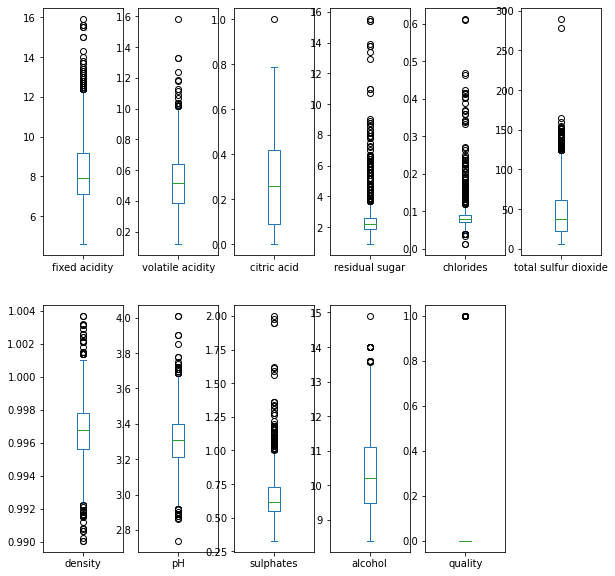

In [282]:
dfWine.plot(kind='box',subplots=True,layout=(2,6),figsize=(10,10)) 

In [283]:
# display the zscore values..
from scipy.stats import zscore
z=np.abs(zscore(dfWine))
z

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.528360,0.961877,1.391472,0.453218,0.243707,0.379133,0.558274,1.288643,0.579207,0.960246,0.396256
1,0.298547,1.967442,1.391472,0.043416,0.223875,0.624363,0.028261,0.719933,0.128950,0.584777,0.396256
2,0.298547,1.297065,1.186070,0.169427,0.096353,0.229047,0.134264,0.331177,0.048089,0.584777,0.396256
3,1.654856,1.384443,1.484154,0.453218,0.264960,0.411500,0.664277,0.979104,0.461180,0.584777,0.396256
4,0.528360,0.961877,1.391472,0.453218,0.243707,0.379133,0.558274,1.288643,0.579207,0.960246,0.396256
...,...,...,...,...,...,...,...,...,...,...,...
1594,1.217796,0.403229,0.980669,0.382271,0.053845,0.075043,0.978765,0.899886,0.461180,0.072294,0.396256
1595,1.390155,0.123905,0.877968,0.240375,0.541259,0.137820,0.862162,1.353436,0.601055,0.729364,0.396256
1596,1.160343,0.099554,0.723916,0.169427,0.243707,0.196679,0.533554,0.705508,0.542042,0.541630,0.396256
1597,1.390155,0.654620,0.775267,0.382271,0.264960,0.075043,0.676657,1.677400,0.305990,0.209308,0.396256


In [284]:
# display the zscore values which is higher than 3
threshold=3
print(np.where(z>3))

(array([  13,   15,   17,   17,   19,   33,   38,   42,   43,   45,   81,
         81,   83,   86,   88,   91,   92,   95,  106,  106,  109,  120,
        126,  127,  142,  144,  147,  151,  151,  151,  151,  163,  164,
        169,  169,  181,  199,  226,  226,  240,  243,  244,  258,  258,
        274,  281,  291,  324,  325,  339,  340,  347,  354,  374,  381,
        391,  396,  400,  442,  442,  451,  467,  480,  480,  494,  515,
        544,  554,  554,  555,  555,  557,  557,  568,  588,  591,  595,
        608,  614,  636,  639,  649,  649,  651,  652,  652,  652,  672,
        672,  684,  690,  692,  692,  695,  723,  724,  730,  754,  776,
        777,  795,  821,  836,  837,  889,  911,  917,  923, 1017, 1018,
       1043, 1051, 1051, 1071, 1074, 1079, 1079, 1081, 1081, 1111, 1114,
       1165, 1186, 1235, 1244, 1244, 1260, 1269, 1269, 1270, 1270, 1288,
       1289, 1299, 1300, 1312, 1316, 1319, 1319, 1321, 1367, 1370, 1370,
       1372, 1372, 1374, 1434, 1434, 1435, 1435, 1

In [285]:
# to check out outliers value at 15th row and 5th column from the above..
z.iloc[15][5] # here the below value is greater than 3...

3.087489568732511

In [286]:
# to take out all the z values which is less than 3...means values without outliers
df_new = dfWine[(z<3).all(axis=1)]
df_new

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,34.0,0.99780,3.51,0.56,9.4,0
1,7.8,0.880,0.00,2.6,0.098,67.0,0.99680,3.20,0.68,9.8,0
2,7.8,0.760,0.04,2.3,0.092,54.0,0.99700,3.26,0.65,9.8,0
3,11.2,0.280,0.56,1.9,0.075,60.0,0.99800,3.16,0.58,9.8,0
4,7.4,0.700,0.00,1.9,0.076,34.0,0.99780,3.51,0.56,9.4,0
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,44.0,0.99490,3.45,0.58,10.5,0
1595,5.9,0.550,0.10,2.2,0.062,51.0,0.99512,3.52,0.76,11.2,0
1596,6.3,0.510,0.13,2.3,0.076,40.0,0.99574,3.42,0.75,11.0,0
1597,5.9,0.645,0.12,2.0,0.075,44.0,0.99547,3.57,0.71,10.2,0


In [287]:
dfWine.shape

(1599, 11)

In [288]:
df_new.shape

(1471, 11)

In [289]:
# While removing outliers, we need to check the data loss and here the data loss is around 8-9%, so that is fine...
141/1599

0.08818011257035648

#### Skewness

In [290]:
df_new.skew()

fixed acidity           0.823729
volatile acidity        0.380186
citric acid             0.295512
residual sugar          2.413361
chlorides               2.296968
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

Here skewness is more than 0.5, so we need to use log transformation method/sqrt method to reduce the skewness of data..



<AxesSubplot:xlabel='fixed acidity', ylabel='Count'>

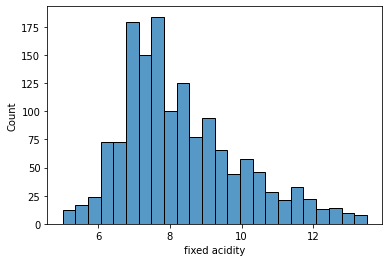

In [291]:
sns.histplot(df_new['fixed acidity'])

In [292]:
# df['fixed acidity'] = np.Log(df['fixed acidity'])
df_new['fixed acidity'] = np.sqrt(df_new['fixed acidity'])

In [293]:
df_new.skew()

fixed acidity           0.604836
volatile acidity        0.380186
citric acid             0.295512
residual sugar          2.413361
chlorides               2.296968
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='fixed acidity', ylabel='Count'>

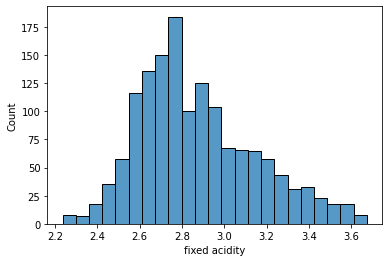

In [294]:
sns.histplot(df_new['fixed acidity'])

In [295]:
df_new['fixed acidity'] = np.sqrt(df_new['fixed acidity'])

In [296]:
# now, we have skewness of fixed acidity under -0.5 to +0.5...
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar          2.413361
chlorides               2.296968
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='fixed acidity', ylabel='Count'>

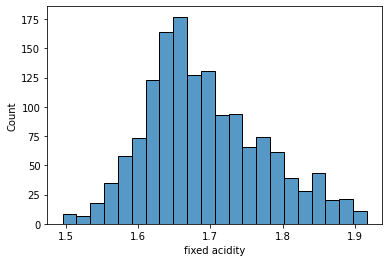

In [297]:
sns.histplot(df_new['fixed acidity'])

<AxesSubplot:xlabel='residual sugar', ylabel='Count'>

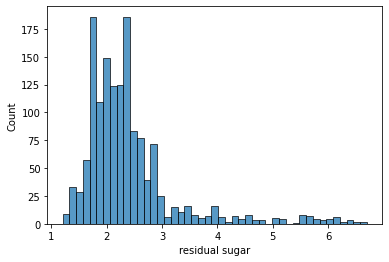

In [298]:
sns.histplot(df_new['residual sugar'])
# this is also a right skewed so we need to remove it...

In [302]:
df_new['residual sugar'] = np.log(df_new['residual sugar'])

In [303]:
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.197052
chlorides               2.296968
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='residual sugar', ylabel='Count'>

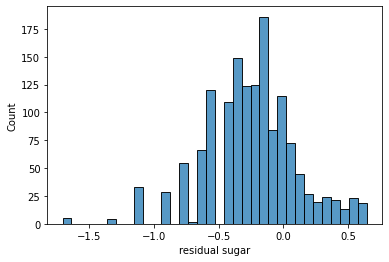

In [304]:
sns.histplot(df_new['residual sugar'])

In [305]:
df_new['residual sugar'] = np.log(df_new['residual sugar'])

In [306]:
# now, we have residual sugar under -0.5 to +0.5...
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.418907
chlorides               2.296968
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='residual sugar', ylabel='Count'>

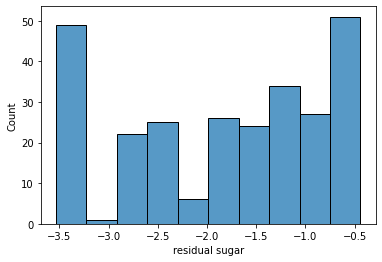

In [307]:
sns.histplot(df_new['residual sugar'])

<AxesSubplot:xlabel='chlorides', ylabel='Count'>

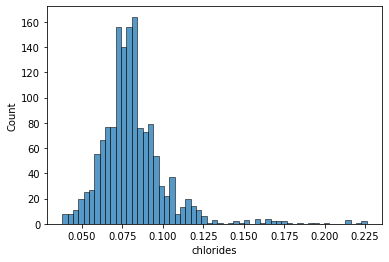

In [308]:
sns.histplot(df_new['chlorides'])
# here, the data is right skewed...

In [309]:
df_new['chlorides'] = np.log(df_new['chlorides'])

In [310]:
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.418907
chlorides               0.540785
total sulfur dioxide    1.169441
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='chlorides', ylabel='Count'>

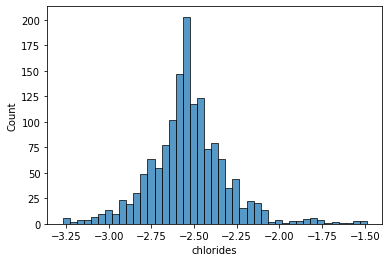

In [311]:
# Now, chlorides is also under -0.5 to +0.5...
sns.histplot(df_new['chlorides'])

<AxesSubplot:xlabel='total sulfur dioxide', ylabel='Count'>

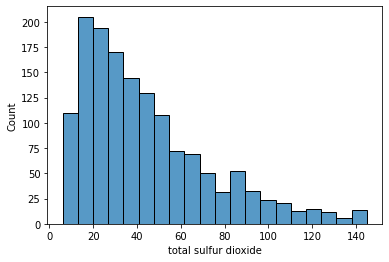

In [312]:
sns.histplot(df_new['total sulfur dioxide'], bins=20)
# data is right skewed..

In [313]:
df_new['total sulfur dioxide'] = np.log(df_new['total sulfur dioxide'])

In [314]:
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.418907
chlorides               0.540785
total sulfur dioxide   -0.103257
density                 0.057944
pH                      0.116405
sulphates               0.877476
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='total sulfur dioxide', ylabel='Count'>

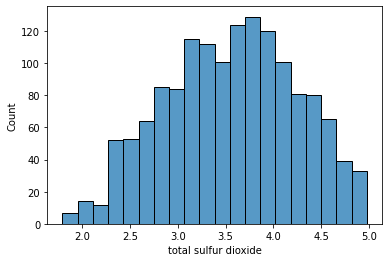

In [315]:
sns.histplot(df_new['total sulfur dioxide'], bins=20)

<AxesSubplot:xlabel='sulphates', ylabel='Count'>

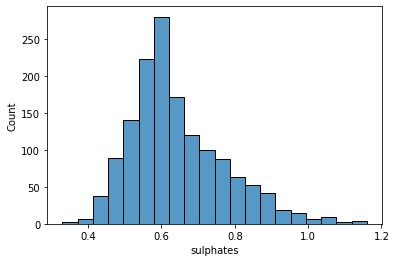

In [316]:
sns.histplot(df_new['sulphates'], bins=20)
# here, the data is little right skewed

In [317]:
df_new['sulphates'] = np.log(df_new['sulphates'])

In [318]:
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.418907
chlorides               0.540785
total sulfur dioxide   -0.103257
density                 0.057944
pH                      0.116405
sulphates               0.333865
alcohol                 0.757992
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='alcohol', ylabel='Count'>

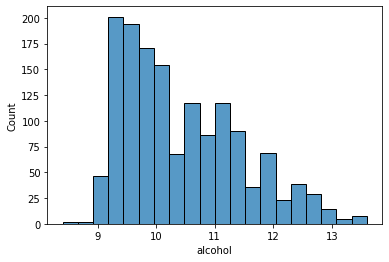

In [319]:
sns.histplot(df_new['alcohol'], bins=20)
# the data is slightly right skewed

In [320]:
df_new['alcohol'] = np.log(df_new['alcohol'])

In [321]:
df_new.skew()

fixed acidity           0.493547
volatile acidity        0.380186
citric acid             0.295512
residual sugar         -0.418907
chlorides               0.540785
total sulfur dioxide   -0.103257
density                 0.057944
pH                      0.116405
sulphates               0.333865
alcohol                 0.589492
quality                 2.101286
dtype: float64

<AxesSubplot:xlabel='alcohol', ylabel='Count'>

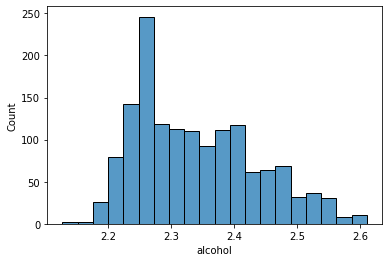

In [322]:
# Now, alcohol is also under -0.5 to +0.5...
sns.histplot(df_new['alcohol'], bins=20)

In [323]:
dfWine.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,60.0,0.9980,3.16,0.58,9.8,0
4,7.4,0.70,0.00,1.9,0.076,34.0,0.9978,3.51,0.56,9.4,0
5,7.4,0.66,0.00,1.8,0.075,40.0,0.9978,3.51,0.56,9.4,0
6,7.9,0.60,0.06,1.6,0.069,59.0,0.9964,3.30,0.46,9.4,0
7,7.3,0.65,0.00,1.2,0.065,21.0,0.9946,3.39,0.47,10.0,1
8,7.8,0.58,0.02,2.0,0.073,18.0,0.9968,3.36,0.57,9.5,1
9,7.5,0.50,0.36,6.1,0.071,102.0,0.9978,3.35,0.80,10.5,0


In [324]:
dfWine.tail(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1589,6.6,0.725,0.20,7.8,0.073,79.0,0.99770,3.29,0.54,9.2,0
1590,6.3,0.550,0.15,1.8,0.077,35.0,0.99314,3.32,0.82,11.6,0
1591,5.4,0.740,0.09,1.7,0.089,26.0,0.99402,3.67,0.56,11.6,0
1592,6.3,0.510,0.13,2.3,0.076,40.0,0.99574,3.42,0.75,11.0,0
1593,6.8,0.620,0.08,1.9,0.068,38.0,0.99651,3.42,0.82,9.5,0
1594,6.2,0.600,0.08,2.0,0.090,44.0,0.99490,3.45,0.58,10.5,0
1595,5.9,0.550,0.10,2.2,0.062,51.0,0.99512,3.52,0.76,11.2,0
1596,6.3,0.510,0.13,2.3,0.076,40.0,0.99574,3.42,0.75,11.0,0
1597,5.9,0.645,0.12,2.0,0.075,44.0,0.99547,3.57,0.71,10.2,0
1598,6.0,0.310,0.47,3.6,0.067,42.0,0.99549,3.39,0.66,11.0,0


In [325]:
# If there is a high variance in data of a column then we use scaling...
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
scaledData=scale.fit_transform(x)
print(scaledData)

[[-0.52835961  0.96187667 -1.39147228 ...  1.28864292 -0.57920652
  -0.96024611]
 [-0.29854743  1.96744245 -1.39147228 ... -0.7199333   0.1289504
  -0.58477711]
 [-0.29854743  1.29706527 -1.18607043 ... -0.33117661 -0.04808883
  -0.58477711]
 ...
 [-1.1603431  -0.09955388 -0.72391627 ...  0.70550789  0.54204194
   0.54162988]
 [-1.39015528  0.65462046 -0.77526673 ...  1.6773996   0.30598963
  -0.20930812]
 [-1.33270223 -1.21684919  1.02199944 ...  0.51112954  0.01092425
   0.54162988]]


#### Checking the random state

In [326]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    dtc = DecisionTreeClassifier()
    dtc.fit(x_train,y_train)
    pred = dtc.predict(x_test)
    accu = accuracy_score(y_test,pred)
    if accu>maxAccu:
        maxAccu=accu
        maxRS=i
print("Best Accuracy is",accu,"on Random State",maxRS)

Best Accuracy is 0.85625 on Random State 179


In [327]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=179)

In [328]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)
print(accuracy_score(y_test,pred_dtc))
print(confusion_matrix(y_test,pred_dtc))
print(classification_report(y_test,pred_dtc))

0.90625
[[394  27]
 [ 18  41]]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       421
           1       0.60      0.69      0.65        59

    accuracy                           0.91       480
   macro avg       0.78      0.82      0.80       480
weighted avg       0.91      0.91      0.91       480



In [329]:
from sklearn.ensemble import RandomForestClassifier
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
pred=RFC.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))  
print(classification_report(y_test,pred))

0.9145833333333333
[[410  11]
 [ 30  29]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       421
           1       0.72      0.49      0.59        59

    accuracy                           0.91       480
   macro avg       0.83      0.73      0.77       480
weighted avg       0.91      0.91      0.91       480



In [330]:
from sklearn.neighbors import KNeighborsClassifier

In [331]:
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)
knn.score(x_train,y_train)
predknn=knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

0.8583333333333333
[[400  21]
 [ 47  12]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       421
           1       0.36      0.20      0.26        59

    accuracy                           0.86       480
   macro avg       0.63      0.58      0.59       480
weighted avg       0.83      0.86      0.84       480



In [332]:
from sklearn.svm import SVC

In [333]:
from sklearn.svm import SVC
svc=SVC(kernel='rbf') # by default kernel is rbf...or we can simply write svc=SVC()
svc.fit(x_train,y_train)
svc.score(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8791666666666667
[[421   0]
 [ 58   1]]
              precision    recall  f1-score   support

           0       0.88      1.00      0.94       421
           1       1.00      0.02      0.03        59

    accuracy                           0.88       480
   macro avg       0.94      0.51      0.48       480
weighted avg       0.89      0.88      0.82       480



In [334]:
def svmkernel(ker): 
    scv=SVC(kernel=ker) 
    scv.fit(x_train,y_train)
    scv.score(x_train,y_train)
    predscv=scv.predict(x_test)
    print(accuracy_score(y_test,predscv))
    print(confusion_matrix(y_test,predscv))
    print(classification_report(y_test,predscv))

In [335]:
svmkernel('rbf')

0.8791666666666667
[[421   0]
 [ 58   1]]
              precision    recall  f1-score   support

           0       0.88      1.00      0.94       421
           1       1.00      0.02      0.03        59

    accuracy                           0.88       480
   macro avg       0.94      0.51      0.48       480
weighted avg       0.89      0.88      0.82       480



In [336]:
svmkernel('poly')

0.8791666666666667
[[421   0]
 [ 58   1]]
              precision    recall  f1-score   support

           0       0.88      1.00      0.94       421
           1       1.00      0.02      0.03        59

    accuracy                           0.88       480
   macro avg       0.94      0.51      0.48       480
weighted avg       0.89      0.88      0.82       480



In [337]:
svmkernel('linear')

0.8770833333333333
[[421   0]
 [ 59   0]]
              precision    recall  f1-score   support

           0       0.88      1.00      0.93       421
           1       0.00      0.00      0.00        59

    accuracy                           0.88       480
   macro avg       0.44      0.50      0.47       480
weighted avg       0.77      0.88      0.82       480



Here, we can see that RandomForestClassifier is the best model as it is providing 91% accuracy.
However, still we cannot say that this is the best model and we need to perform cross validation.

#### Cross Validation

In [338]:
from sklearn.model_selection import cross_val_score

In [339]:
print(cross_val_score(dtc,x,y,cv=5).mean())

0.8061246081504703


In [340]:
print(cross_val_score(RFC,x,y,cv=5).mean())

0.8699275078369906


In [341]:
print(cross_val_score(svc,x,y,cv=5).mean())

0.8642907523510971


In [342]:
print(cross_val_score(knn,x,y,cv=5).mean())

0.8449235893416928


Now, we will perform Hyperparameter Tuning with SVC to increase the performance.

In [346]:
from sklearn.model_selection import GridSearchCV
parameter = {'kernel':['linear','rbf','poly','sigmoid','percomputed'],'C':[1,10,20,30,50]}
gs = GridSearchCV(svc,parameter)
gs.fit(x,y)
gs

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 10, 20, 30, 50],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid',
                                    'percomputed']})

In [347]:
print(gs.best_params_)

{'C': 1, 'kernel': 'linear'}


In [348]:
final_mod = SVC(kernel='linear',C=1)
final_mod.fit(x,y)
final_mod.score(x,y)

0.8642901813633521

#### Saving the best model

In [349]:
import joblib

In [350]:
joblib.dump(final_mod,"Final_Model.pkl")

['Final_Model.pkl']